<a href="https://www.kaggle.com/code/pranaii/e19-customized-css-theme-training-eda-july-19?scriptVersionId=138804584" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## Important graphs at the beginning :)

### Distribution of the data

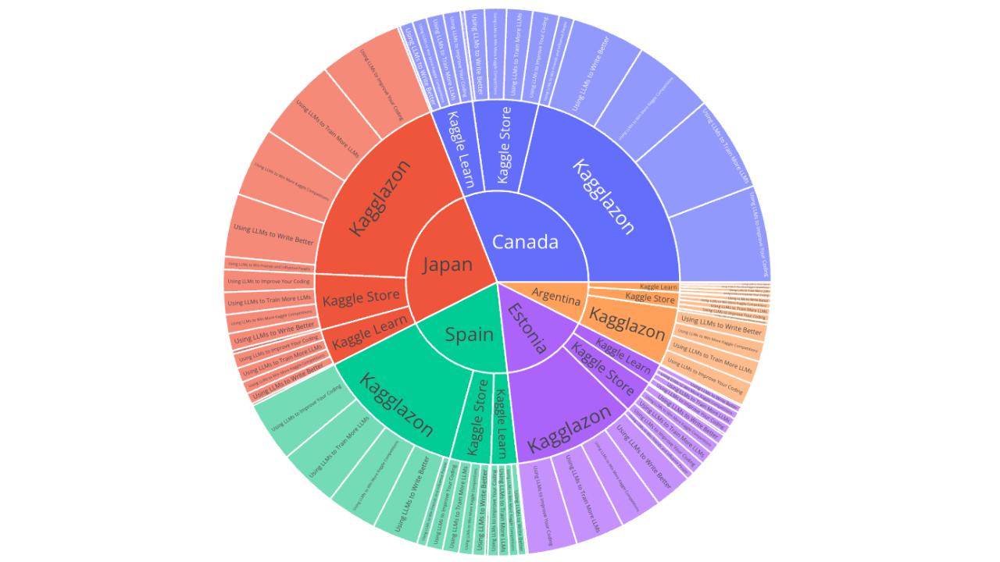

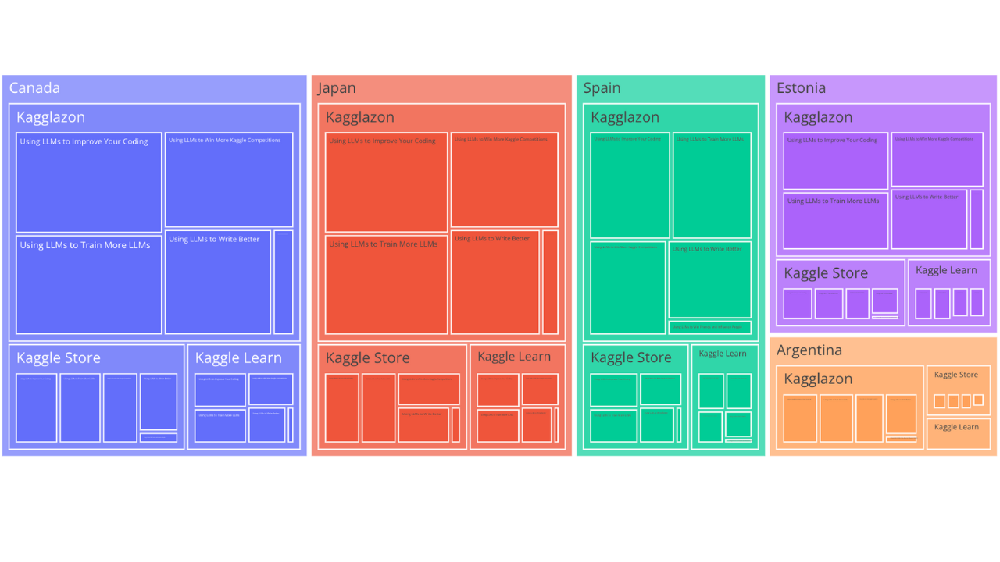

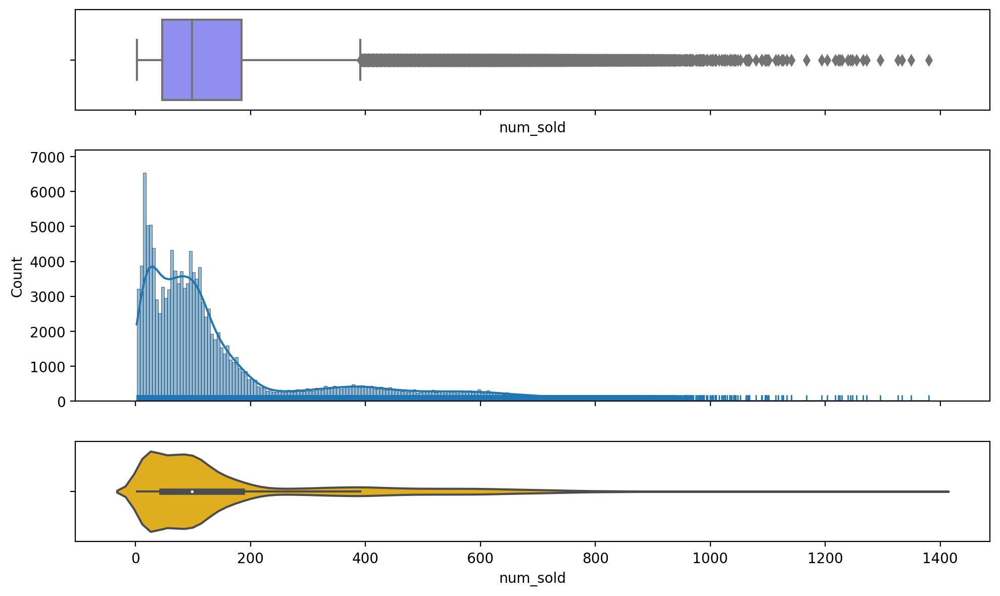

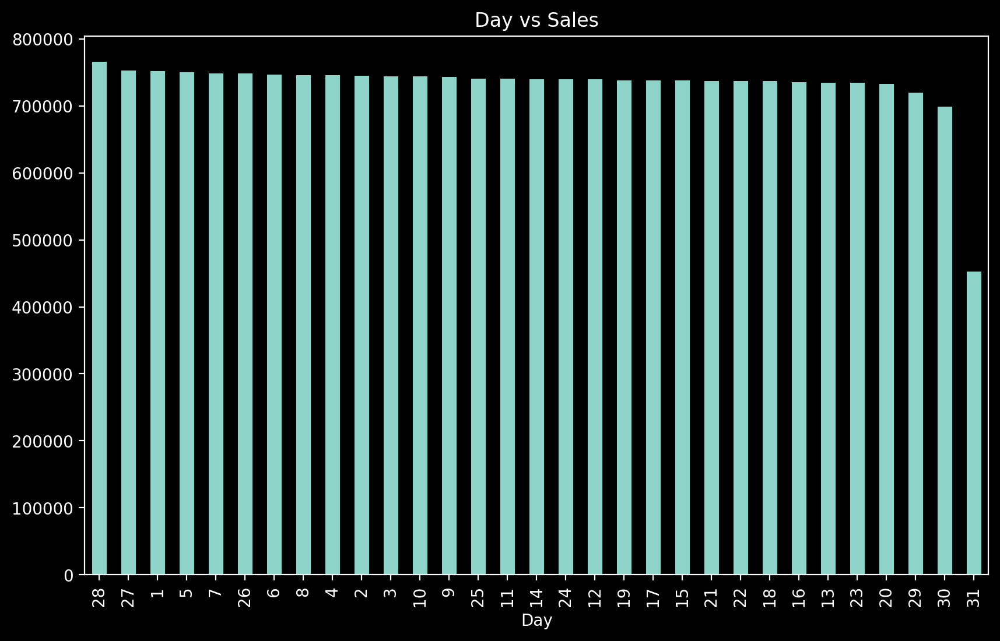

In [1]:
from IPython.core.display import HTML 
HTML (""" 
 <link rel="stylesheet"
          href="https://fonts.googleapis.com/css?family=Open+Sans">
<style>

    h1, h2, h3, h4, h5, h6 {
     font-family: 'Open Sans', serif;
        background: linear-gradient(to right, #ff6a0d, #002cff);
        -webkit-background-clip: text;
        -webkit-text-fill-color: transparent;
        background-size: 400% 400%;
        animation: shine 10s linear infinite alternate-reverse;
    } 
    ul, ol {
        background: linear-gradient(0deg, #000000, #333c99);
        -webkit-background-clip: text;
        -webkit-text-fill-color: transparent; 
     }
     
</style> """)

In [2]:
HTML (""" <style>

    body[data-jp-theme-light="true"] .jp-Notebook .CodeMirror.cm-s-jupyter {
                background: linear-gradient(to right, #ffffff, #9dbffe, #4685fa) !important;
                border-radius: 3em;
                border: 0px #ffffff;
    }
    
    jp-CodeConsole .CodeMirror.cm-s-jupyter {
                background: linear-gradient(to right, #ffffff, #9dbffe, #4685fa) !important;
                border-radius: 3em;
                border: 0px #ffffff;
    }

    div.input_area {
                background: linear-gradient(to right, #ffffff, #9dbffe, #4685fa) !important;
                border-radius: 3em;
                border: 0px #ffffff;
    }

    @keyframes shine {
        0% { background-position: 0% 50%; }
        50% { background-position: 100% 50%; }
        100% { background-position: 0% 50%; }
    }

    @-webkit-keyframes shine {
            0% { background-position: 0% 50%;}
            50% { background-position: 100% 50%; }
            100% { background-position: 0% 50%; }      
    }
    
    @-moz-keyframes shine {
            0% { background-position: 0% 50%; }
            50% { background-position: 100% 50%; }
            100% { background-position: 0% 50%;}
    }
    
    div.input{
        max-width:fit-content !important;
    }
    
   div.text_cell_render {
      border: 3px solid #f000;
      border-radius: 2em;
      background: linear-gradient(#ffffff, #dee9ff) padding-box, linear-gradient(
            var(--angle),
            #ff6a0d,
            #687aff
          ) border-box;    
      width: fit-content;
      animation: 8s rotate linear infinite;
      padding: 16px 16px 16px 16px;

   }
    @keyframes rotate {
      to {
            --angle: 360deg;
          }
        }

    @property --angle {
      syntax: "<angle>";
      initial-value: 0deg;
      inherits: false;
    }
    

</style> """)

# All insights/observations (so far)
- We see no missing values, great news :)
- In Sales, we see so many outliers after 400.
- All countries are equally distributed.
- We see a peak at each new year. As it is a holiday season, discounts would be more and more units got sold.
- All the products are following a steady pattern and it is repeating every year.
- All countries are almost equally distributed except Argentina.
- Kagglazon store is more popular than other stores in all the 4 countries.
- How are the trends in sales?
    - On month ends and month starting, we see more sales. This means most of the people either
        - Right after the salary is credited at the month end, people spend their money.
        - Or, whatever amount is left over at the month end after all expenses, people spend that remaining amount.

### Let's start from scratch now

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import random as rnd
import plotly.express as px 
import math, missingno as msno 

from sklearn import datasets
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC

import datetime

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sns.set(rc={"figure.dpi":100, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")
from IPython.display import set_matplotlib_formats
%config InlineBackend.figure_format = 'retina'
plt.style.use('dark_background')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Dataset Description

For this challenge, you will be predicting a full year worth of sales for various fictitious learning modules from different fictitious Kaggle-branded stores in different (real!) countries. This dataset is completely synthetic, but contains many effects you see in real-world data, e.g., weekend and holiday effect, seasonality, etc. You are given the task of predicting sales during for year 2022.


## Files

-  **train.csv** - the training set, which includes the sales data for each date-country-store-item combination.
-  **test.csv** - the test set; your task is to predict the corresponding item sales for each date-country-store-item combination. Note the Public leaderboard is scored on the first quarter of the test year, and the Private on the remaining.
-  **sample_submission.csv** - a sample submission file in the correct format

# 1. Data - how is it, data types, stats & more...

In [4]:
df_train = pd.read_csv('/kaggle/input/playground-series-s3e19/train.csv')
df_train

,id,date,country,store,product,num_sold
0,0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63
1,1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66
2,2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9
3,3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59
4,4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49
...,...,...,...,...,...,...
136945,136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700
136946,136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752
136947,136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111
136948,136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641


## 1.1 Data types & Statistics of the data

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136950 entries, 0 to 136949
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        136950 non-null  int64 
 1   date      136950 non-null  object
 2   country   136950 non-null  object
 3   store     136950 non-null  object
 4   product   136950 non-null  object
 5   num_sold  136950 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 6.3+ MB


In [6]:
# Remove id
df_train.drop(['id'],axis=1,inplace=True)

In [7]:
df_train.describe(include=['object'])

df_train.describe(include=['int'])

,date,country,store,product
count,136950,136950,136950,136950
unique,1826,5,3,5
top,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding
freq,75,27390,45650,27390


,num_sold
count,136950.000000
mean,165.522636
std,183.691575
min,2.000000
25%,46.000000
50%,98.000000
75%,184.000000
max,1380.000000


- #### Only target column is numeric
- #### Features are all categorical + 1 datetime

## 1.2  Checking missing/null values

Text(0.5, 0, 'Column')

Text(0, 0.5, '% of non-null values')

Text(0.5, 1.0, 'Column - % of non-null values')

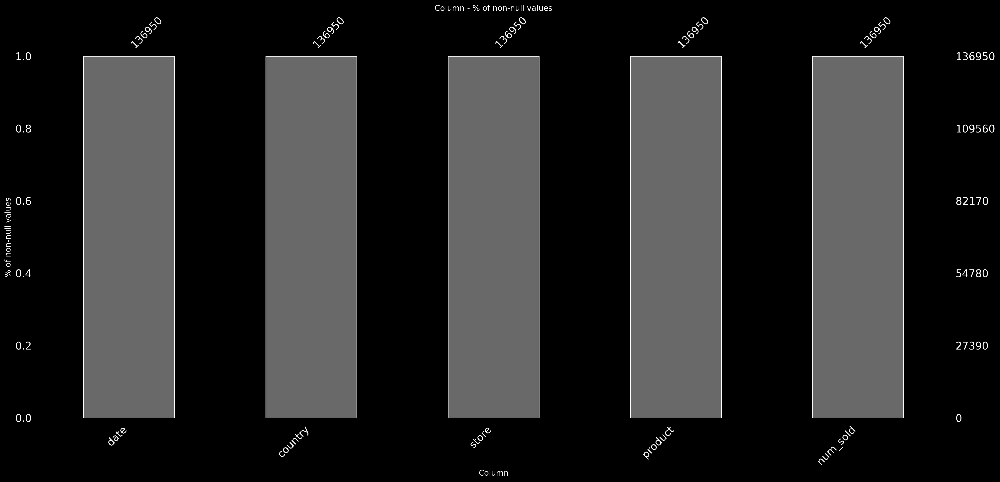

In [8]:
ax = msno.bar(df_train)
ax.set_xlabel("Column")
ax.set_ylabel("% of non-null values")
ax.set_title("Column - % of non-null values")

- ### We see no missing values

## 1.3 Duplicate and NaNs

In [9]:
cols = []
duplicate_values = []
duplicate_pct = []
nan_values = []
nan_pct = []

for i in df_train.columns:
    cols.append(i)
    nan_values.append(df_train[i].isnull().sum())
    nan_pct.append(
        round(((df_train[i].isnull().sum()) / df_train.shape[0]) * 100, 2))

    duplicate_values.append(df_train[i].duplicated().sum())
    duplicate_pct.append(
        round(((df_train[i].duplicated().sum()) / df_train.shape[0]) * 100, 2))

duplicate_and_nan_count = pd.DataFrame({
    "Column": cols,
    "Duplicate values": duplicate_values,
    "Duplicate %": duplicate_pct,
    "NaN values": nan_values,
    "NaN %": nan_pct
})
duplicate_and_nan_count

,Column,Duplicate values,Duplicate %,NaN values,NaN %
0,date,135124,98.67,0,0.0
1,country,136945,100.00,0,0.0
2,store,136947,100.00,0,0.0
3,product,136945,100.00,0,0.0
4,num_sold,135922,99.25,0,0.0


## # of unique values in each column

date        1826
country        5
store          3
product        5
num_sold    1028
dtype: int64

Text(0.5, 1.0, 'No. of unique values - column wise')

Text(0.5, 0, 'Column')

Text(0, 0.5, 'Count')

Text(0, 5, '1826')

Text(0, 5, '5')

Text(0, 5, '3')

Text(0, 5, '5')

Text(0, 5, '1028')

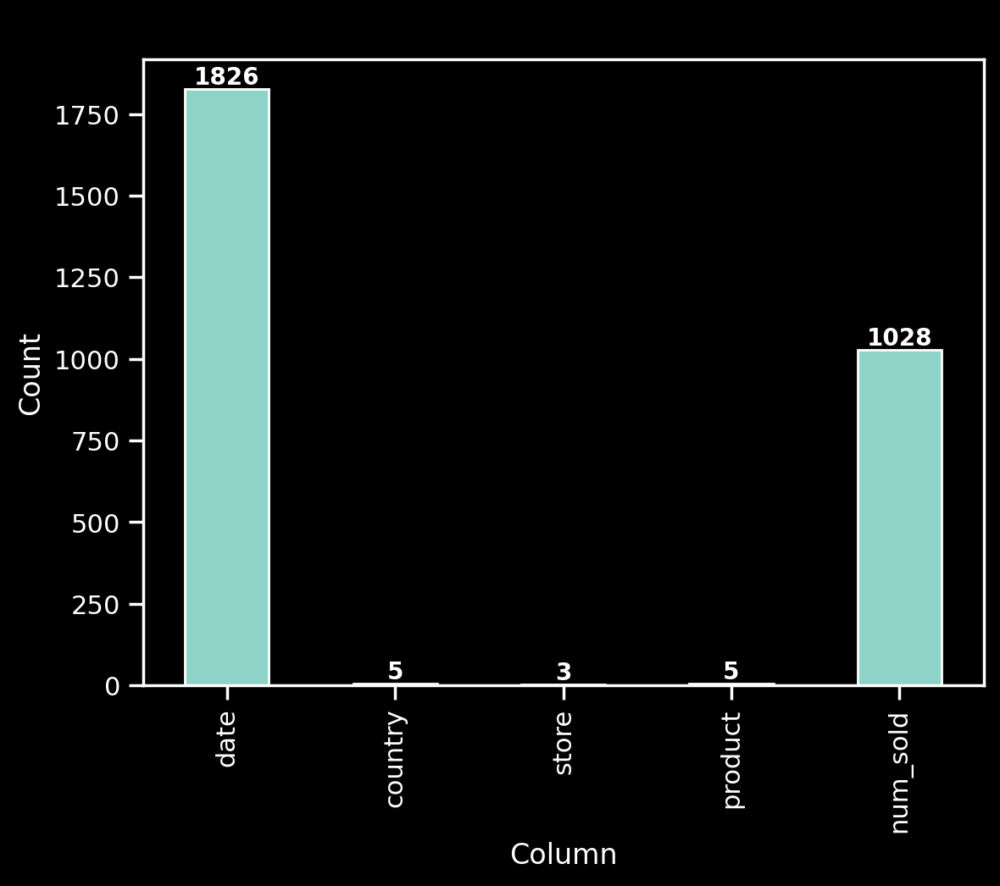

In [10]:
column_unique = dict()
for i in df_train.columns:
    column_unique[i] = df_train[i].nunique()
column_unique = pd.Series(column_unique)
column_unique
ax = column_unique.plot.bar()       
plt.title('No. of unique values - column wise',
          fontdict={
              'fontsize': 16,
              'color': 'black',
              'fontweight': 'bold'
          })
plt.xlabel("Column")
plt.ylabel("Count")
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center',
                va='center',
                fontsize=10,
                fontweight='bold',
                xytext=(0, 5),
                textcoords='offset points')

### 1.4 Exploring target

In [11]:
def plot_hist_box_violin(dataframe, column):
    fig, (ax_box, ax_hist, ax_violin) = plt.subplots(
        3,
        1,
        figsize=(10, 6),
        sharex='col',
        gridspec_kw={"height_ratios": (.2, .5, .2)})
    sns.boxplot(data=dataframe, x=column, ax=ax_box, palette="cool")
    sns.histplot(data=dataframe,
                 x=column,
                 kde=True,
                 ax=ax_hist,
                 legend=False,
                 palette="Wistia")
    sns.rugplot(data=dataframe, x=column, ax=ax_hist)
    sns.violinplot(data=dataframe, x=column, ax=ax_violin, palette="Wistia")
    plt.style.use("dark_background")
    plt.tight_layout()

/tmp/ipykernel_33/3263624907.py:9: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=dataframe,


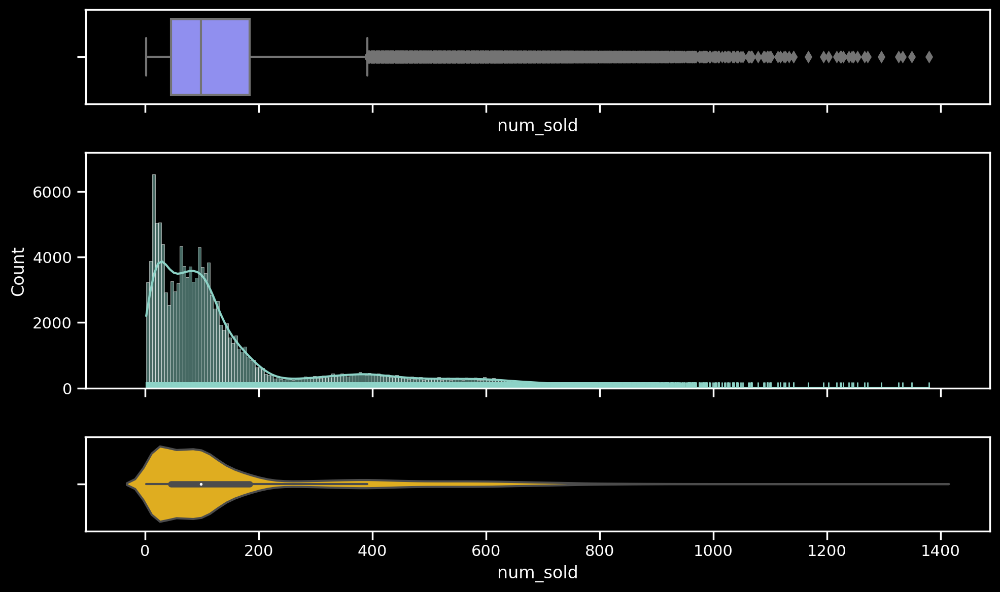

In [12]:
plot_hist_box_violin(df_train, 'num_sold')

- #### We see so many outliers after 400, need to check how much % is above 400

In [13]:
df_train[df_train['num_sold'] > 400].shape[0]
df_train.shape[0]
print("Percentage of values above 400",(df_train[df_train['num_sold'] > 400].shape[0]/df_train.shape[0])*100)

18214

136950

Percentage of values above 400 13.29974443227455


In [14]:
def draw_column_pie(column):
    value_counts = df_train[column].value_counts()
    colors = plt.cm.Dark2
    value_counts.plot(kind='pie',
                      y=value_counts.values,
                      autopct='%1.0f%%',
                      colormap=colors,
                      labeldistance=.55,
                      pctdistance=0.3,
                      radius=1,
                      wedgeprops={'linewidth': 1.4},
                      textprops={'weight': 'bold'},
                      explode=[0.1] * len(value_counts))
    plt.style.use("default")
    plt.title(column + " column distribution")
    plt.tight_layout()

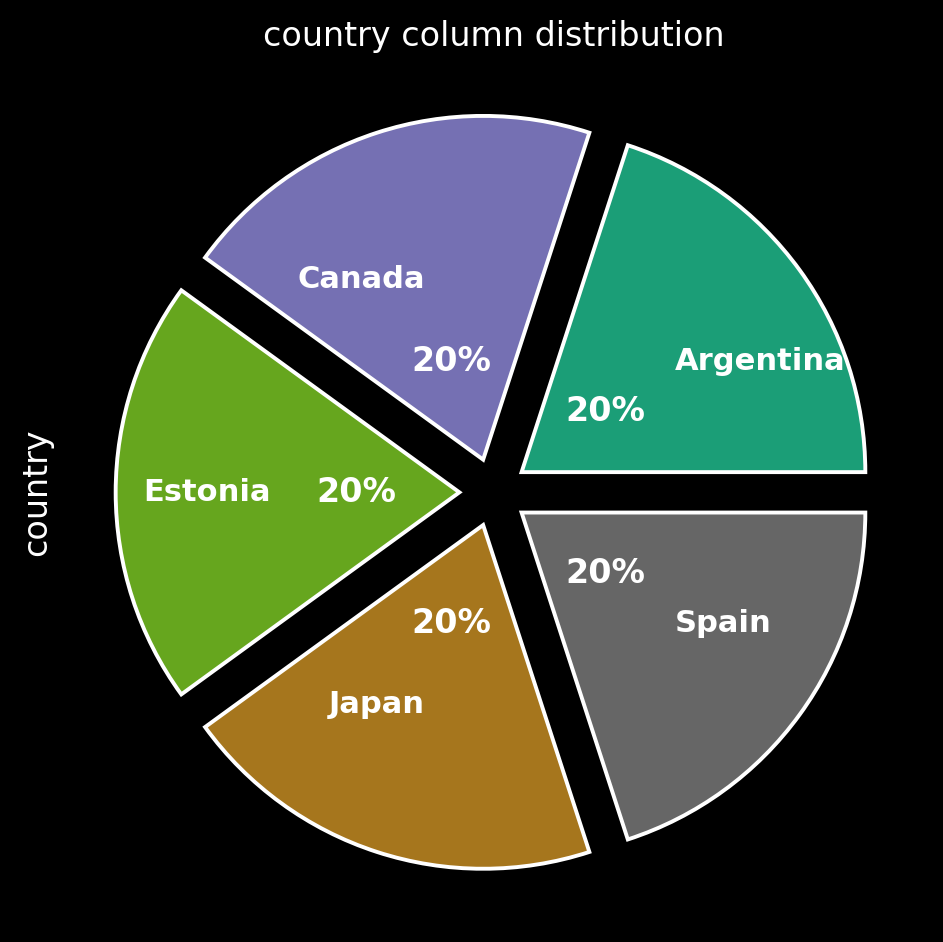

In [15]:
draw_column_pie('country')

- ### All countries are equally distributed.

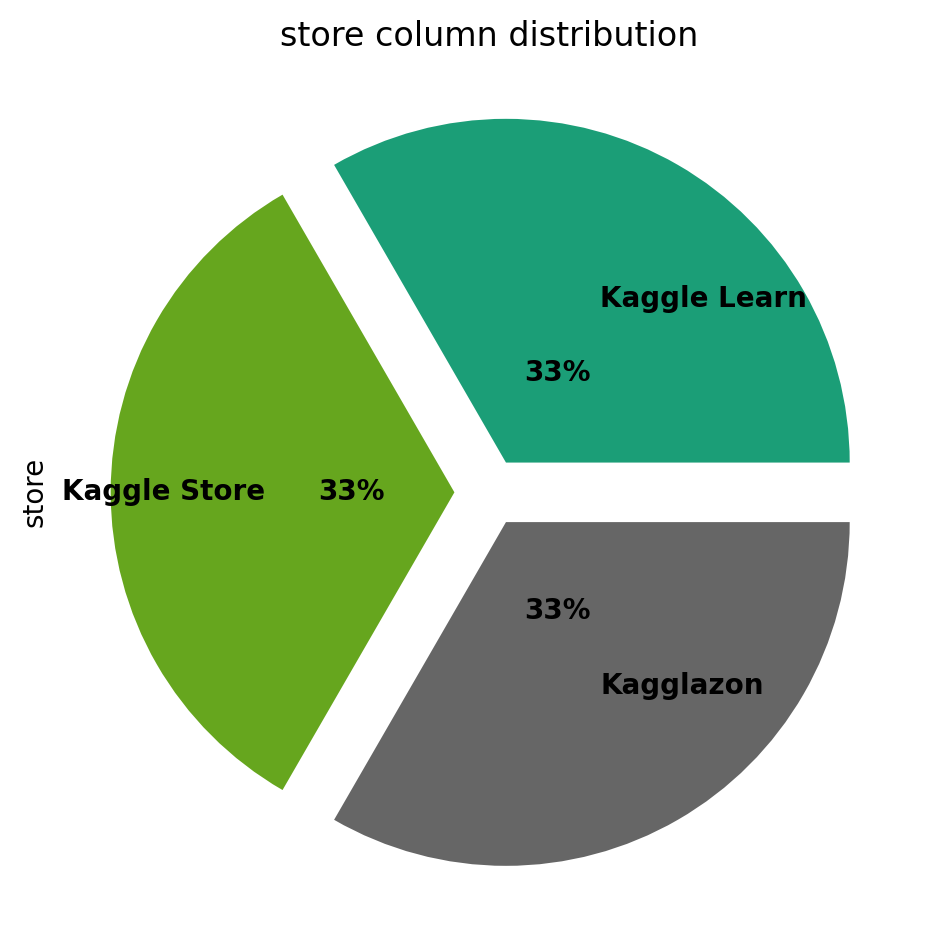

In [16]:
draw_column_pie('store')

In [17]:
# Convert date column to datetime
df_train['date'] = pd.to_datetime( df_train['date'])
df_train['date']

0        2017-01-01
1        2017-01-01
2        2017-01-01
3        2017-01-01
4        2017-01-01
            ...    
136945   2021-12-31
136946   2021-12-31
136947   2021-12-31
136948   2021-12-31
136949   2021-12-31
Name: date, Length: 136950, dtype: datetime64[ns]

In [18]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136950 entries, 0 to 136949
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   date      136950 non-null  datetime64[ns]
 1   country   136950 non-null  object        
 2   store     136950 non-null  object        
 3   product   136950 non-null  object        
 4   num_sold  136950 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 5.2+ MB


### Plot each column vs num_sold

In [19]:
df_train

,date,country,store,product,num_sold
0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63
1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66
2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9
3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59
4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49
...,...,...,...,...,...
136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700
136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752
136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111
136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641


In [20]:
def draw_timeline(hue, palette):
    plt.figure(figsize=(20, 10))
    sns.lineplot(df_train, x='date', y='num_sold', hue=hue, palette=palette, errorbar = None)
    plt.title("Units sold vs " + hue + " over time")
    plt.tight_layout()

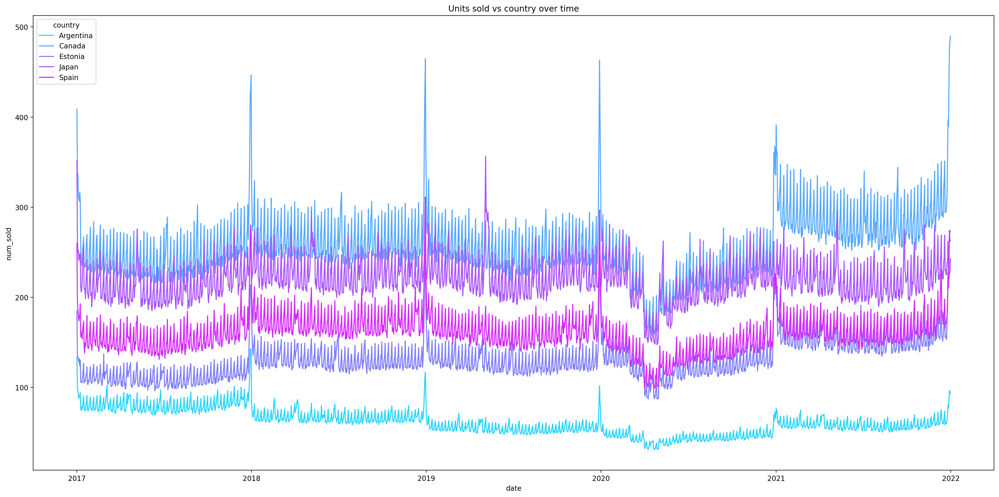

In [21]:
draw_timeline('country', 'cool')

#### Observations
- We see a peak at each new year. As it is a holiday season, discounts would be more and more units got sold.

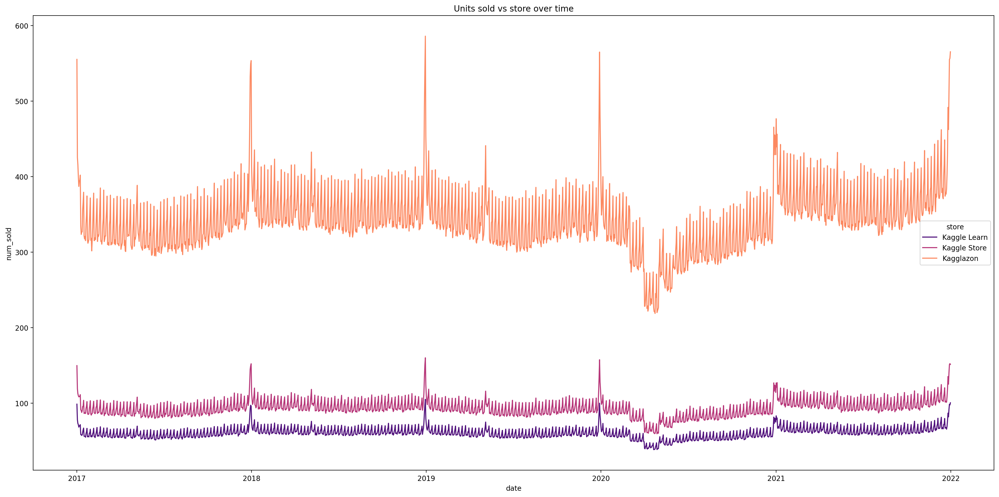

In [22]:
draw_timeline('store', 'magma')

#### Observations
- We see a peak at each new year. As it is a holiday season, discounts would be more and more units got sold.

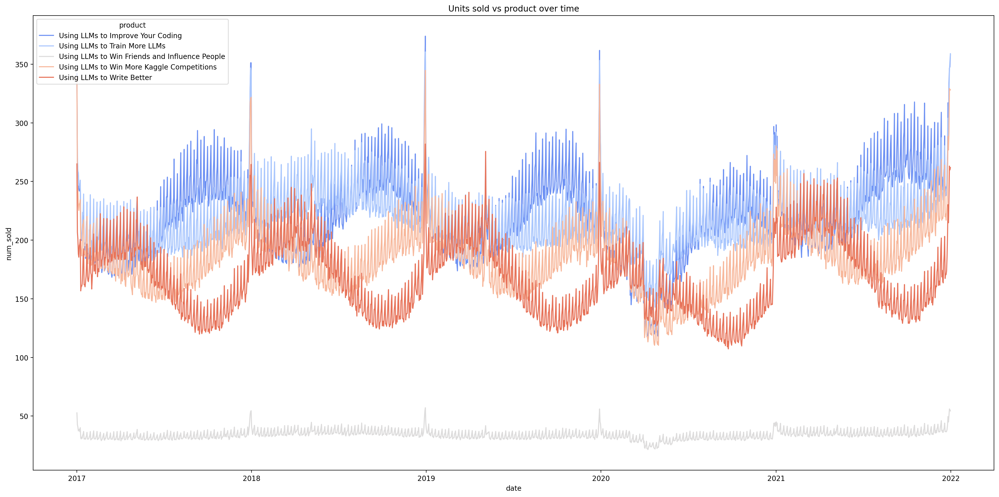

In [23]:
draw_timeline('product', 'coolwarm')

In [24]:
df_train['product'].unique()

array(['Using LLMs to Improve Your Coding',
       'Using LLMs to Train More LLMs',
       'Using LLMs to Win Friends and Influence People',
       'Using LLMs to Win More Kaggle Competitions',
       'Using LLMs to Write Better'], dtype=object)

In [25]:
df_train[df_train['product'] == 'Using LLMs to Win Friends and Influence People'].describe()
df_train[df_train['product'] != 'Using LLMs to Win Friends and Influence People'].describe()

,num_sold
count,27390.000000
mean,34.047609
std,32.338357
min,2.000000
25%,12.000000
50%,20.000000
75%,50.000000
max,211.000000


,num_sold
count,109560.000000
mean,198.391393
std,191.089141
min,11.000000
25%,71.000000
50%,117.000000
75%,267.000000
max,1380.000000


#### Observations
- **"Using LLMs to Write Better"** has a wavy pattern like sin function
- **"Using LLMs to Win Friends and Influence People"** has significantly lower sales than any other product/category ranging from 2 to 211 at an average of 34. Where as other products range from 11 to 1380 at an average of 199.
- All the products are following a steady pattern and it is repeating every year.

In [26]:
from datetime import datetime

In [27]:
df_train.groupby(by=['country','store']).sum()

/tmp/ipykernel_33/726647639.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_train.groupby(by=['country','store']).sum()


num_sold
country   store                 
Argentina Kagglazon      1165626
          Kaggle Learn    203018
          Kaggle Store    314600
Canada    Kagglazon      4842322
          Kaggle Learn    854127
          Kaggle Store   1316665
Estonia   Kagglazon      2472309
          Kaggle Learn    434389
          Kaggle Store    670621
Japan     Kagglazon      4154670
          Kaggle Learn    731518
          Kaggle Store   1127598
Spain     Kagglazon      3026408
          Kaggle Learn    532882
          Kaggle Store    821572

In [28]:
fig = px.sunburst(df_train,
                  path=['country', 'store', 'product'],
                  values='num_sold',
                  title='Distribution of Data')
fig.show()

#### Observations

- All countries are almost equally distributed except Argentina.
- Kagglazon store is more popular than other stores in all the 4 countries.

#### Draw bar chart of which day/month has most sales

In [29]:
df_train
df_train.date

,date,country,store,product,num_sold
0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63
1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66
2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9
3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59
4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49
...,...,...,...,...,...
136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700
136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752
136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111
136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641


0        2017-01-01
1        2017-01-01
2        2017-01-01
3        2017-01-01
4        2017-01-01
            ...    
136945   2021-12-31
136946   2021-12-31
136947   2021-12-31
136948   2021-12-31
136949   2021-12-31
Name: date, Length: 136950, dtype: datetime64[ns]

### For more insights, creating new features

In [30]:
df_train['Day'] =  df_train.date.dt.day
df_train['Month'] =  df_train.date.dt.month
df_train['Year'] =  df_train.date.dt.year

In [31]:
df_train

,date,country,store,product,num_sold,Day,Month,Year
0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63,1,1,2017
1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66,1,1,2017
2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9,1,1,2017
3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59,1,1,2017
4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49,1,1,2017
...,...,...,...,...,...,...,...,...
136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700,31,12,2021
136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752,31,12,2021
136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111,31,12,2021
136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641,31,12,2021


In [32]:
day_vs_sales = df_train.groupby(by=['Day']).num_sold.sum()
day_vs_sales.sort_values(ascending=False,inplace=True)
day_vs_sales

Day
28    765744
27    752519
1     752394
5     750195
7     748753
26    748498
6     746777
8     745925
4     745734
2     744961
3     744516
10    744230
9     743316
25    740743
11    740526
14    740144
24    740036
12    739420
19    738185
17    738123
15    737973
21    737109
22    736859
18    736794
16    735802
13    734759
23    734738
20    732425
29    719814
30    698703
31    452610
Name: num_sold, dtype: int64

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Day vs Sales')

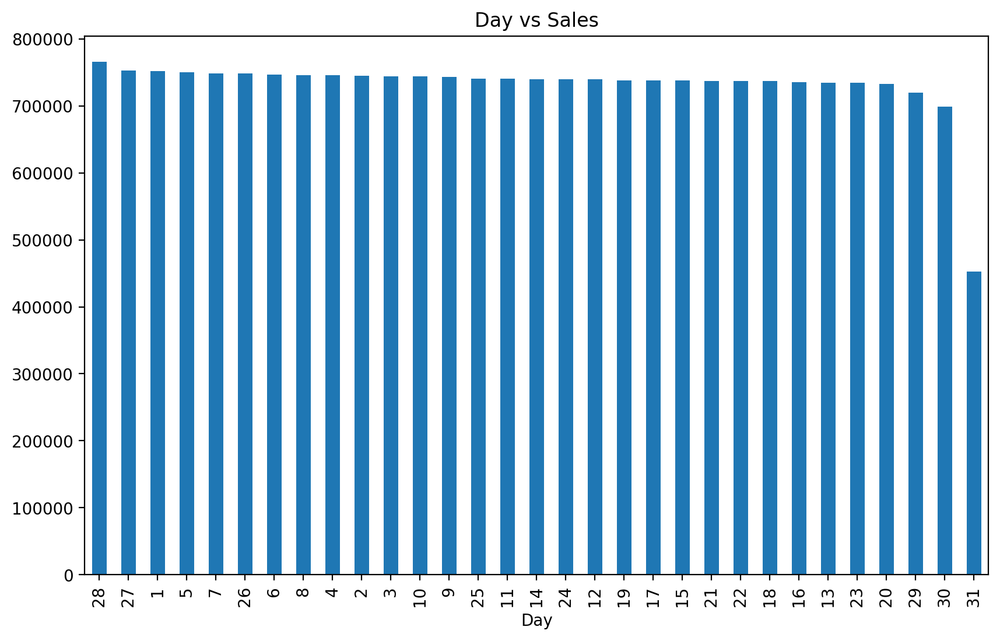

In [33]:
plt.figure(figsize=(10,6))
ax = day_vs_sales.plot.bar()
ax.set_title("Day vs Sales")

#### Observations
- On month ends and month starting, we see more sales. This means most of the people either
    - Right after the salary is credited at the month end, people spend their money. 
    - Or, whatever amount is left over at the month end after all expenses, people spend that remaining amount.
- Although, we see the trend that almost all the days have equal weightage.

Month
Dec     2133081
Jan     2042783
Oct     1924133
Nov     1909588
Mar     1905982
Aug     1867996
May     1866246
July    1858402
Sep     1833097
Feb     1782267
June    1779787
Apr     1764963
Name: num_sold, dtype: int64

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Month vs Sales')

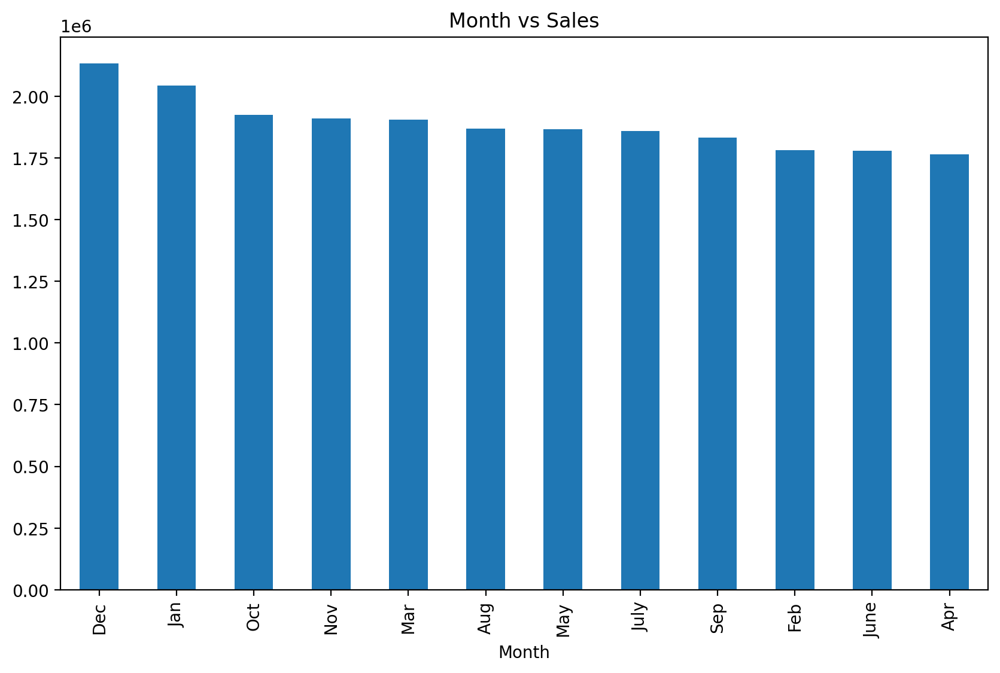

In [34]:
month_vs_sales = df_train.groupby(by=['Month']).num_sold.sum()
month_vs_sales.sort_values(ascending=False,inplace=True)

# For better readability in the bar plot, convert month number to month name

month_vs_sales.index = month_vs_sales.index.map({
    1:"Jan",
    2:"Feb",
    3:"Mar",
    4:"Apr",
    5:"May",
    6:"June",
    7:"July",
    8:"Aug",
    9:"Sep",
    10:"Oct",
    11:"Nov",
    12:"Dec"
})
month_vs_sales

plt.figure(figsize=(10,6))
ax = month_vs_sales.plot.bar()
ax.set_title("Month vs Sales")

#### Observations
- Monstly in December & January, the sales are higher due to Christmas & New Year holiday season.

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Year vs Sales')

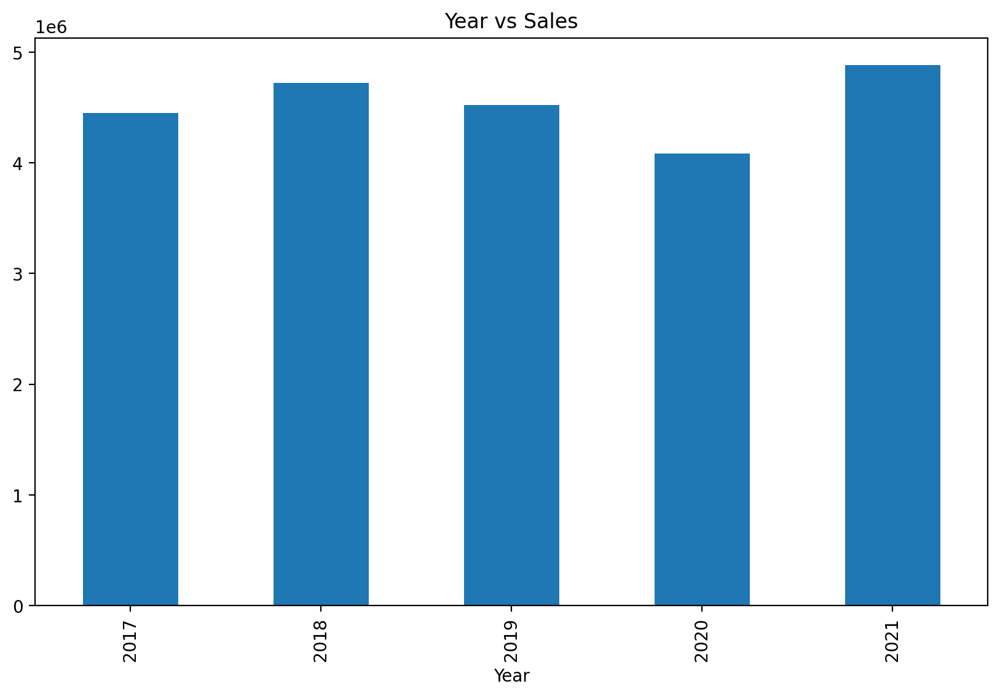

In [35]:
year_vs_sales = df_train.groupby(by=['Year']).num_sold.sum()
plt.figure(figsize=(10,6))
ax = year_vs_sales.plot.bar()
ax.set_title("Year vs Sales")

#### Observations
- We see a decline in sales from 2018 to 2020 but it significantly jumped to the all time highest in 2021

# To be continued in next versions
- Comparison train vs test data
- Training the model
- More

# Training vs testing set comparison

In [36]:
df_test = pd.read_csv("/kaggle/input/playground-series-s3e19/test.csv")
df_test

,id,date,country,store,product
0,136950,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding
1,136951,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs
2,136952,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People
3,136953,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions
4,136954,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better
...,...,...,...,...,...
27370,164320,2022-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding
27371,164321,2022-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs
27372,164322,2022-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People
27373,164323,2022-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions


## Country column comparison

Argentina    27390
Canada       27390
Estonia      27390
Japan        27390
Spain        27390
Name: country, dtype: int64

<Axes: ylabel='country'>

Text(0.5, 1.0, 'Train data country column distribution')

Argentina    5475
Canada       5475
Estonia      5475
Japan        5475
Spain        5475
Name: country, dtype: int64

<Axes: ylabel='country'>

Text(0.5, 1.0, 'Test data country column distribution')

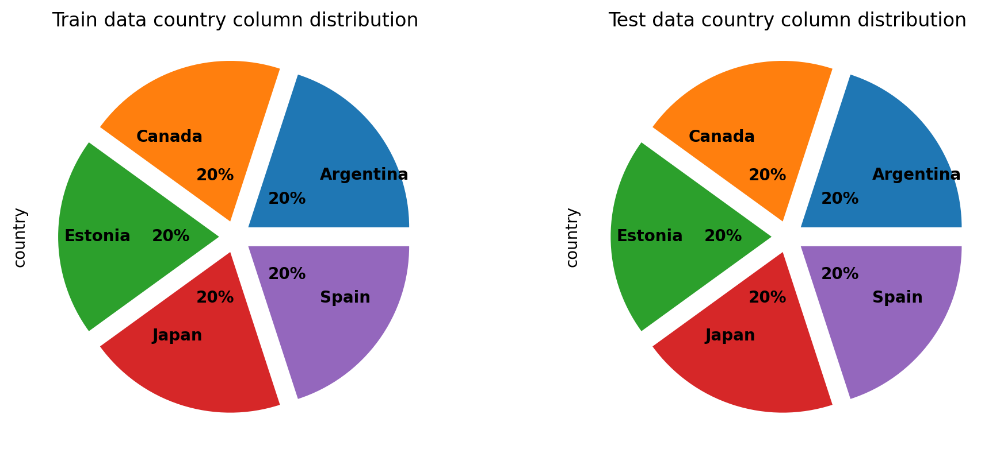

In [37]:
fig, ax = plt.subplots(1, 2,figsize=(10,4))
column='country'

value_counts = df_train[column].value_counts()
value_counts
value_counts.plot(kind='pie',
                  ax=ax[0],
                  y=value_counts.values,
                  autopct='%1.0f%%',

                  labeldistance=.55,
                  pctdistance=0.3,
                  radius=1,
                  wedgeprops={'linewidth': 1.4},
                  textprops={'weight': 'bold'},
                  explode=[0.1] * len(value_counts))
ax[0].set_title("Train data " + column + " column distribution")

value_counts = df_test[column].value_counts()
value_counts
value_counts.plot(kind='pie',
                  ax=ax[1],
                  y=value_counts.values,
                  autopct='%1.0f%%',

                  labeldistance=.55,
                  pctdistance=0.3,
                  radius=1,
                  wedgeprops={'linewidth': 1.4},
                  textprops={'weight': 'bold'},
                  explode=[0.1] * len(value_counts))
ax[1].set_title("Test data " + column + " column distribution")


plt.tight_layout()

### Observations
- We see the same distribution in test and train data

## Store column comparison

Kaggle Learn    45650
Kaggle Store    45650
Kagglazon       45650
Name: store, dtype: int64

<Axes: ylabel='store'>

Text(0.5, 1.0, 'Train data store column distribution')

Kaggle Learn    9125
Kaggle Store    9125
Kagglazon       9125
Name: store, dtype: int64

<Axes: ylabel='store'>

Text(0.5, 1.0, 'Test data store column distribution')

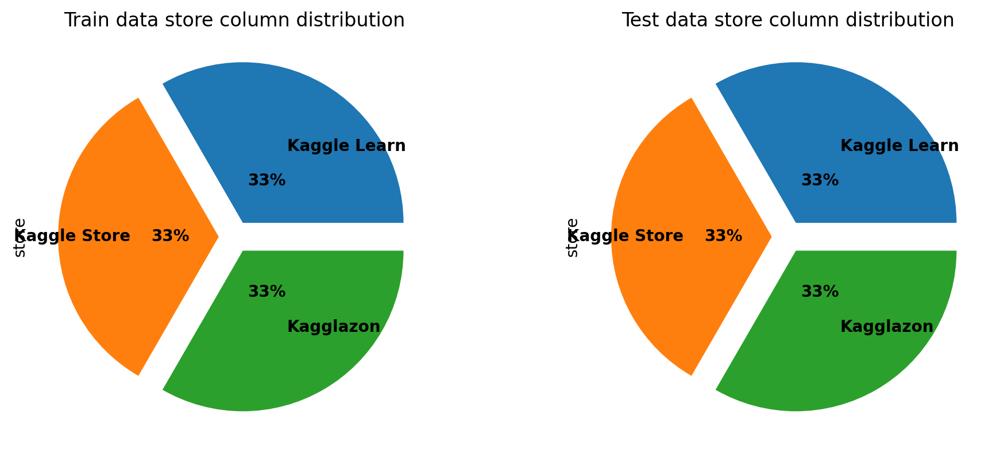

In [38]:
fig, ax = plt.subplots(1, 2,figsize=(10,4))
column='store'

value_counts = df_train[column].value_counts()
value_counts
value_counts.plot(kind='pie',
                  ax=ax[0],
                  y=value_counts.values,
                  autopct='%1.0f%%',

                  labeldistance=.55,
                  pctdistance=0.3,
                  radius=1,
                  wedgeprops={'linewidth': 1.4},
                  textprops={'weight': 'bold'},
                  explode=[0.1] * len(value_counts))
ax[0].set_title("Train data " + column + " column distribution")

value_counts = df_test[column].value_counts()
value_counts
value_counts.plot(kind='pie',
                  ax=ax[1],
                  y=value_counts.values,
                  autopct='%1.0f%%',

                  labeldistance=.55,
                  pctdistance=0.3,
                  radius=1,
                  wedgeprops={'linewidth': 1.4},
                  textprops={'weight': 'bold'},
                  explode=[0.1] * len(value_counts))
ax[1].set_title("Test data " + column + " column distribution")


plt.tight_layout()

### Observations
- We see the same distribution in test and train data

## Product column comparison

Using LLMs to Improve Your Coding                 27390
Using LLMs to Train More LLMs                     27390
Using LLMs to Win Friends and Influence People    27390
Using LLMs to Win More Kaggle Competitions        27390
Using LLMs to Write Better                        27390
Name: product, dtype: int64

<Axes: ylabel='product'>

Text(0.5, 1.0, 'Train data product column distribution')

Using LLMs to Improve Your Coding                 5475
Using LLMs to Train More LLMs                     5475
Using LLMs to Win Friends and Influence People    5475
Using LLMs to Win More Kaggle Competitions        5475
Using LLMs to Write Better                        5475
Name: product, dtype: int64

<Axes: ylabel='product'>

Text(0.5, 1.0, 'Test data product column distribution')

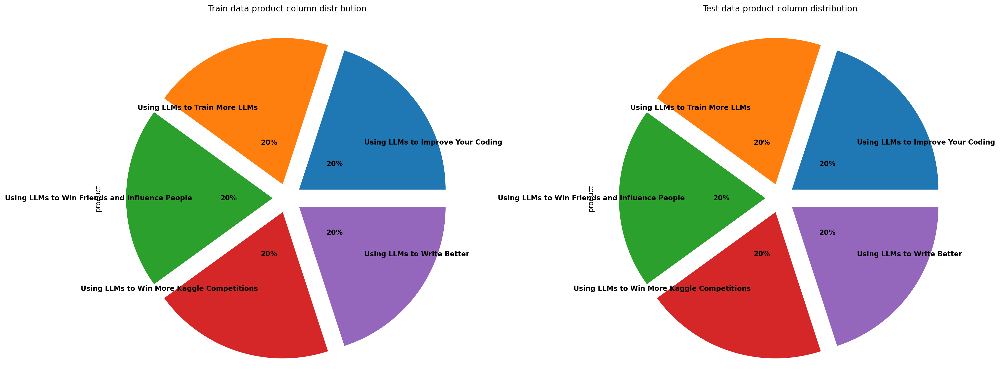

In [39]:
fig, ax = plt.subplots(1, 2,figsize=(20,8))
column='product'

value_counts = df_train[column].value_counts()
value_counts
value_counts.plot(kind='pie',
                  ax=ax[0],
                  y=value_counts.values,
                  autopct='%1.0f%%',

                  labeldistance=.55,
                  pctdistance=0.3,
                  radius=1,
                  wedgeprops={'linewidth': 1.4},
                  textprops={'weight': 'bold'},
                  explode=[0.1] * len(value_counts))
ax[0].set_title("Train data " + column + " column distribution")

value_counts = df_test[column].value_counts()
value_counts
value_counts.plot(kind='pie',
                  ax=ax[1],
                  y=value_counts.values,
                  autopct='%1.0f%%',

                  labeldistance=.55,
                  pctdistance=0.3,
                  radius=1,
                  wedgeprops={'linewidth': 1.4},
                  textprops={'weight': 'bold'},
                  explode=[0.1] * len(value_counts))
ax[1].set_title("Test data " + column + " column distribution")


plt.tight_layout()

### Observations
- We see the same distribution in test and train data

## Date column

In [40]:
# Creating new features

df_test['date'] = pd.to_datetime(df_test['date'])
df_test['Day'] =  df_test.date.dt.day
df_test['Month'] =  df_test.date.dt.month
df_test['Year'] =  df_test.date.dt.year

2017-01-01    75
2020-05-11    75
2020-05-09    75
2020-05-08    75
2020-05-07    75
              ..
2018-08-29    75
2018-08-28    75
2018-08-27    75
2018-08-26    75
2021-12-31    75
Name: date, Length: 1826, dtype: int64

<Axes: >

Text(0.5, 1.0, 'Train data date column distribution')

2022-01-01    75
2022-09-09    75
2022-09-07    75
2022-09-06    75
2022-09-05    75
              ..
2022-05-01    75
2022-04-30    75
2022-04-29    75
2022-04-28    75
2022-12-31    75
Name: date, Length: 365, dtype: int64

<Axes: >

Text(0.5, 1.0, 'Test data date column distribution')

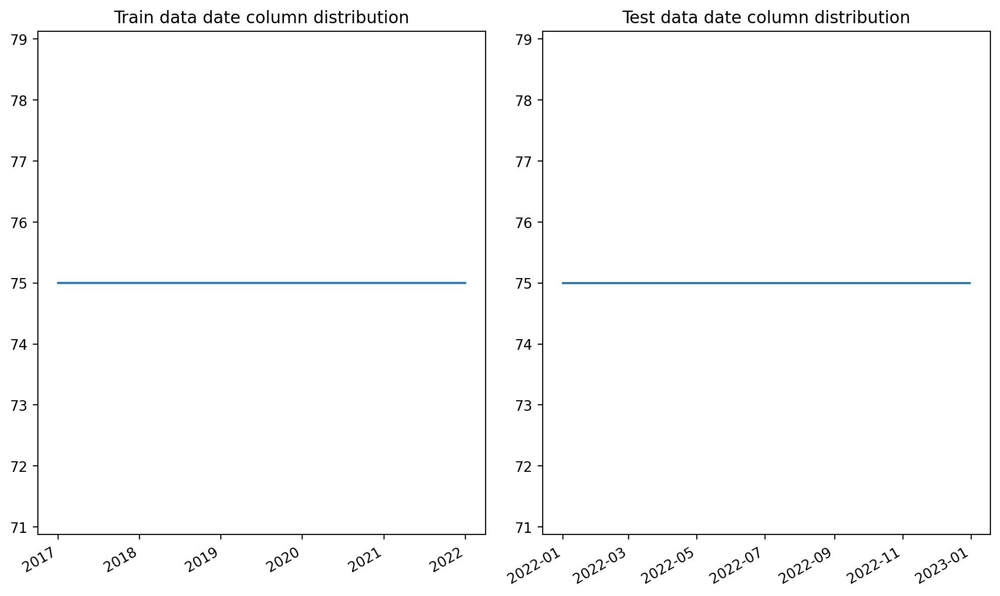

In [41]:
fig, ax = plt.subplots(1, 2,figsize=(10,6))
column='date'

value_counts = df_train[column].value_counts()
value_counts
value_counts.plot(ax=ax[0],
                  y=value_counts.values)
ax[0].set_title("Train data " + column + " column distribution")

value_counts = df_test[column].value_counts()
value_counts
value_counts.plot(ax=ax[1],
                  y=value_counts.values,
                  )
ax[1].set_title("Test data " + column + " column distribution")


plt.tight_layout()

### Observations
- We see that training data range is 2017 to 2022
- Test data started from where training data has ended i.e 2022 to 2022 end.
- Test data is like forecasting where we have to predict the sales in 2022 given training data from 2017 to 2021.

### Checking the months and years in Train vs Test data

In [42]:
df_train.groupby(by=['Year','Month']).count()

date  country  store  product  num_sold   Day
Year Month                                               
2017 1      2325     2325   2325     2325      2325  2325
     2      2100     2100   2100     2100      2100  2100
     3      2325     2325   2325     2325      2325  2325
     4      2250     2250   2250     2250      2250  2250
     5      2325     2325   2325     2325      2325  2325
     6      2250     2250   2250     2250      2250  2250
     7      2325     2325   2325     2325      2325  2325
     8      2325     2325   2325     2325      2325  2325
     9      2250     2250   2250     2250      2250  2250
     10     2325     2325   2325     2325      2325  2325
     11     2250     2250   2250     2250      2250  2250
     12     2325     2325   2325     2325      2325  2325
2018 1      2325     2325   2325     2325      2325  2325
     2      2100     2100   2100     2100      2100  2100
     3      2325     2325   2325     2325      2325  2325
     4      2250     2250   2250     2250      2250  2250
     5      2325     2325   2325     2325      2325  2325
     6      2250     2250   2250     2250      2250  2250
     7      2325     2325   2325     2325      2325  2325
     8      2325     2325   2325     2325      2325  2325
     9      2250     2250   2250     2250      2250  2250
     10     2325     2325   2325     2325      2325  2325
     11     2250     2250   2250     2250      2250  2250
     12     2325     2325   2325     2325      2325  2325
2019 1      2325     2325   2325     2325      2325  2325
     2      2100     2100   2100     2100      2100  2100
     3      2325     2325   2325     2325      2325  2325
     4      2250     2250   2250     2250      2250  2250
     5      2325     2325   2325     2325      2325  2325
     6      2250     2250   2250     2250      2250  2250
     7      2325     2325   2325     2325      2325  2325
     8      2325     2325   2325     2325      2325  2325
     9      2250     2250   2250     2250      2250  2250
     10     2325     2325   2325     2325      2325  2325
     11     2250     2250   2250     2250      2250  2250
     12     2325     2325   2325     2325      2325  2325
2020 1      2325     2325   2325     2325      2325  2325
     2      2175     2175   2175     2175      2175  2175
     3      2325     2325   2325     2325      2325  2325
     4      2250     2250   2250     2250      2250  2250
     5      2325     2325   2325     2325      2325  2325
     6      2250     2250   2250     2250      2250  2250
     7      2325     2325   2325     2325      2325  2325
     8      2325     2325   2325     2325      2325  2325
     9      2250     2250   2250     2250      2250  2250
     10     2325     2325   2325     2325      2325  2325
     11     2250     2250   2250     2250      2250  2250
     12     2325     2325   2325     2325      2325  2325
2021 1      2325     2325   2325     2325      2325  2325
     2      2100     2100   2100     2100      2100  2100
     3      2325     2325   2325     2325      2325  2325
     4      2250     2250   2250     2250      2250  2250
     5      2325     2325   2325     2325      2325  2325
     6      2250     2250   2250     2250      2250  2250
     7      2325     2325   2325     2325      2325  2325
     8      2325     2325   2325     2325      2325  2325
     9      2250     2250   2250     2250      2250  2250
     10     2325     2325   2325     2325      2325  2325
     11     2250     2250   2250     2250      2250  2250
     12     2325     2325   2325     2325      2325  2325

In [43]:
df_test.groupby(by=['Year','Month']).count()

id  date  country  store  product   Day
Year Month                                           
2022 1      2325  2325     2325   2325     2325  2325
     2      2100  2100     2100   2100     2100  2100
     3      2325  2325     2325   2325     2325  2325
     4      2250  2250     2250   2250     2250  2250
     5      2325  2325     2325   2325     2325  2325
     6      2250  2250     2250   2250     2250  2250
     7      2325  2325     2325   2325     2325  2325
     8      2325  2325     2325   2325     2325  2325
     9      2250  2250     2250   2250     2250  2250
     10     2325  2325     2325   2325     2325  2325
     11     2250  2250     2250   2250     2250  2250
     12     2325  2325     2325   2325     2325  2325

# Training the model

In [44]:
# Creating a new column - week

df_train['Week'] = df_train.date.dt.isocalendar().week
df_test['Week'] = df_test.date.dt.isocalendar().week

In [45]:
df_train.sample(10)
df_test .sample(10)

,date,country,store,product,num_sold,Day,Month,Year,Week
93813,2020-06-04,Spain,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,49,4,6,2020,23
24878,2017-11-28,Japan,Kaggle Store,Using LLMs to Win More Kaggle Competitions,142,28,11,2017,48
80332,2019-12-08,Argentina,Kaggle Store,Using LLMs to Win Friends and Influence People,7,8,12,2019,49
63019,2019-04-21,Canada,Kaggle Learn,Using LLMs to Write Better,124,21,4,2019,16
54353,2018-12-26,Japan,Kaggle Store,Using LLMs to Win More Kaggle Competitions,149,26,12,2018,52
120134,2021-05-21,Japan,Kagglazon,Using LLMs to Write Better,584,21,5,2021,20
134663,2021-12-01,Estonia,Kaggle Store,Using LLMs to Win More Kaggle Competitions,113,1,12,2021,48
34463,2018-04-05,Estonia,Kaggle Store,Using LLMs to Win More Kaggle Competitions,86,5,4,2018,14
38556,2018-05-30,Argentina,Kaggle Store,Using LLMs to Train More LLMs,57,30,5,2018,22
125711,2021-08-04,Argentina,Kagglazon,Using LLMs to Train More LLMs,137,4,8,2021,31


,id,date,country,store,product,Day,Month,Year,Week
11580,148530,2022-06-04,Estonia,Kaggle Learn,Using LLMs to Improve Your Coding,4,6,2022,22
6955,143905,2022-04-03,Japan,Kagglazon,Using LLMs to Improve Your Coding,3,4,2022,13
20498,157448,2022-10-01,Canada,Kaggle Store,Using LLMs to Win More Kaggle Competitions,1,10,2022,39
18775,155725,2022-09-08,Canada,Kagglazon,Using LLMs to Improve Your Coding,8,9,2022,36
2306,139256,2022-01-31,Japan,Kagglazon,Using LLMs to Train More LLMs,31,1,2022,5
25028,161978,2022-11-30,Japan,Kaggle Store,Using LLMs to Win More Kaggle Competitions,30,11,2022,48
13603,150553,2022-07-01,Canada,Kagglazon,Using LLMs to Win More Kaggle Competitions,1,7,2022,26
14779,151729,2022-07-17,Argentina,Kaggle Learn,Using LLMs to Write Better,17,7,2022,28
26500,163450,2022-12-20,Canada,Kagglazon,Using LLMs to Improve Your Coding,20,12,2022,51
25512,162462,2022-12-07,Argentina,Kagglazon,Using LLMs to Win Friends and Influence People,7,12,2022,49


In [46]:
df_train_encoded =  pd.get_dummies(df_train, columns = ['country','store','product'], drop_first=True)
df_train_encoded

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,2021-12-31,700,31,12,2021,52,0,0,0,1,0,0,0,0,0,0
136946,2021-12-31,752,31,12,2021,52,0,0,0,1,0,0,1,0,0,0
136947,2021-12-31,111,31,12,2021,52,0,0,0,1,0,0,0,1,0,0
136948,2021-12-31,641,31,12,2021,52,0,0,0,1,0,0,0,0,1,0


In [47]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.model_selection import train_test_split, cross_val_score

X_train, X_test, y_train, y_test = train_test_split(df_train_encoded.drop(['num_sold','date'],
                                                                  axis=1),
                                                    df_train_encoded['num_sold'],
                                                    train_size=0.8)
X_train
X_test
y_train
y_test

,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
12066,10,6,2017,23,0,0,0,1,0,1,1,0,0,0
118276,27,4,2021,17,0,0,0,0,1,0,1,0,0,0
127999,3,9,2021,35,0,0,1,0,1,0,0,0,0,1
84389,31,1,2020,5,0,0,0,0,0,0,0,0,0,1
73839,12,9,2019,37,0,1,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83055,13,1,2020,3,0,1,0,0,1,0,0,0,0,0
136807,30,12,2021,52,0,0,0,0,0,1,0,1,0,0
35381,17,4,2018,16,0,0,1,0,0,0,1,0,0,0
31749,28,2,2018,9,1,0,0,0,0,1,0,0,0,1


,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
117480,16,4,2021,15,0,1,0,0,1,0,0,0,0,0
129912,29,9,2021,39,0,0,0,0,0,0,0,1,0,0
71830,16,8,2019,33,0,0,1,0,0,0,0,0,0,0
56200,20,1,2019,3,1,0,0,0,0,0,0,0,0,0
22821,1,11,2017,44,1,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60160,14,3,2019,11,0,0,0,0,0,0,0,0,0,0
103682,14,10,2020,42,0,1,0,0,1,0,0,1,0,0
17195,18,8,2017,33,1,0,0,0,0,1,0,0,0,0
80428,9,12,2019,50,1,0,0,0,0,0,0,0,1,0


12066     120
118276     23
127999     69
84389     115
73839      50
         ... 
83055      53
136807     10
35381     589
31749     160
15559      34
Name: num_sold, Length: 109560, dtype: int64

117480     74
129912     25
71830     878
56200     832
22821     170
         ... 
60160     135
103682      9
17195     202
80428     622
101328     19
Name: num_sold, Length: 27390, dtype: int64

LinearRegression()
score(X_test, y_test)  0.7503332533468674
mean_squared_log_error  1.8676061795858625

DecisionTreeRegressor()
score(X_test, y_test)  0.980043066957921
mean_squared_log_error  0.08316246029767069

RandomForestRegressor()
score(X_test, y_test)  0.9866012490704279
mean_squared_log_error  0.06976914407490119

AdaBoostRegressor()
score(X_test, y_test)  0.6861823237373884
mean_squared_log_error  2.2220233667101517

BaggingRegressor()
score(X_test, y_test)  0.9854628757185431
mean_squared_log_error  0.07205787469329486



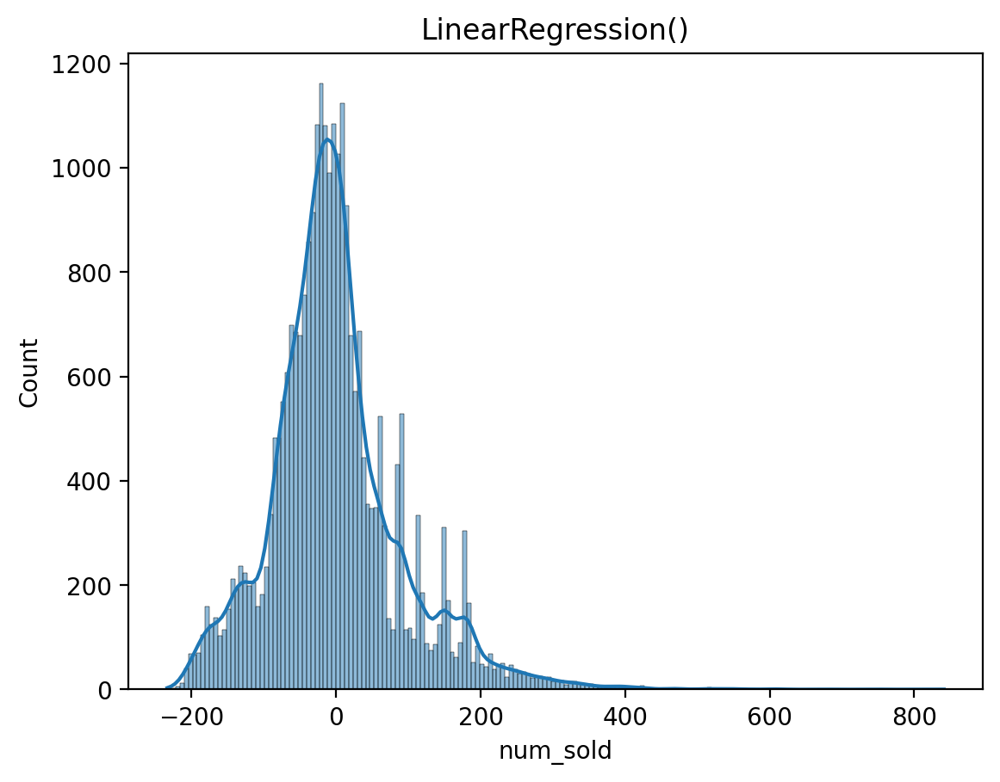

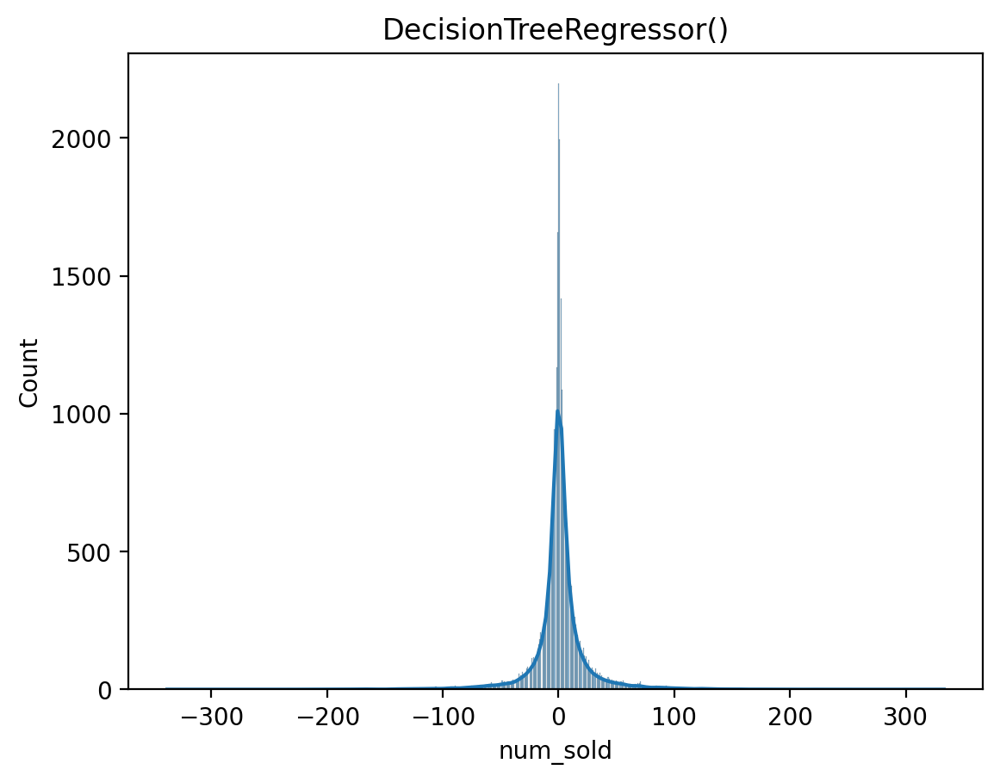

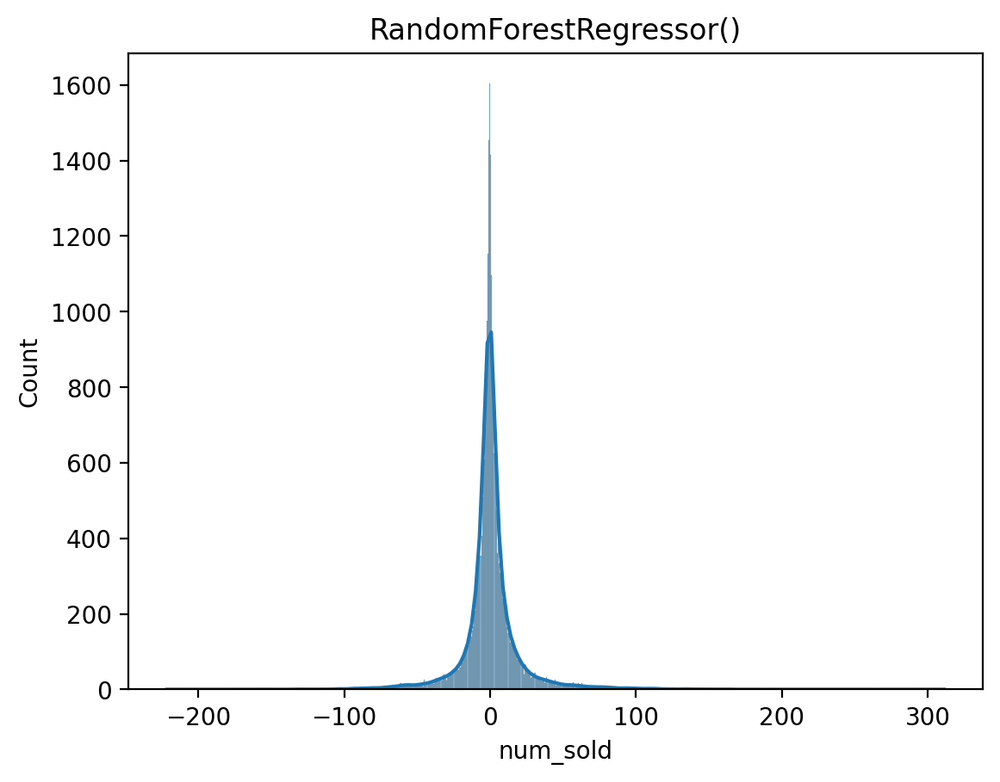

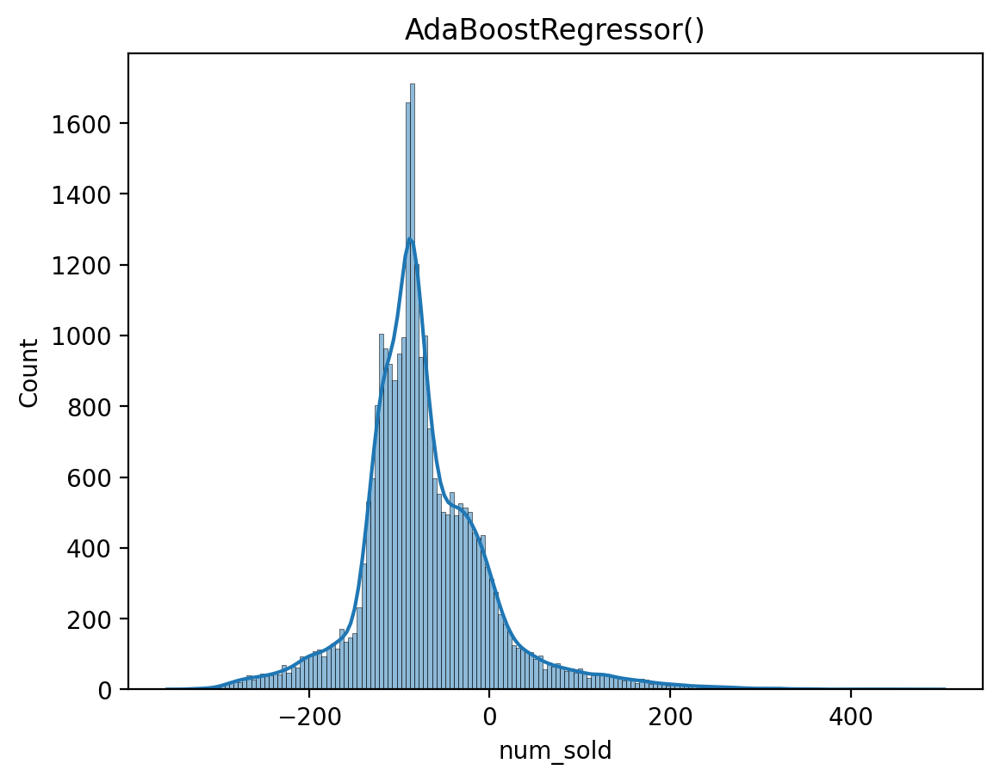

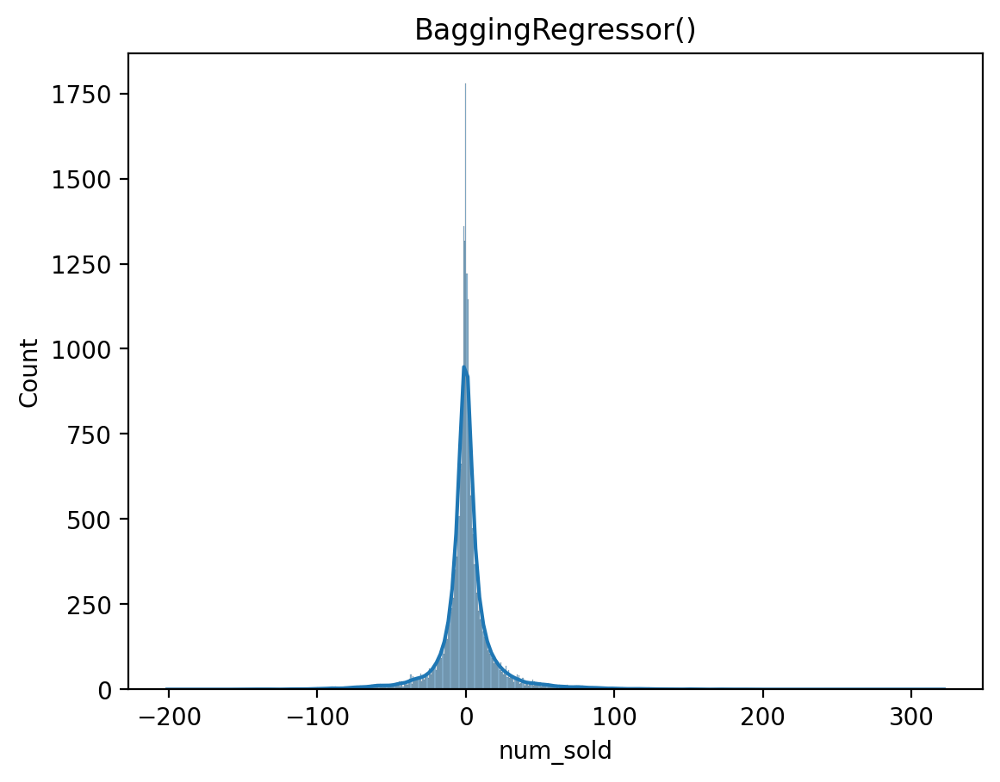

In [48]:
def helper(model):
    print(model)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    plt.figure()
    sns.histplot(y_test - y_pred, kde=True)
    plt.title(model)
    print("score(X_test, y_test) ", model.score(X_test, y_test))
    print("mean_squared_log_error ", mean_absolute_percentage_error(y_test, y_pred))
    print()

lr = LinearRegression()
tree = DecisionTreeRegressor()
rf = RandomForestRegressor()
ab = AdaBoostRegressor()
br = BaggingRegressor()
for i in [lr, tree, rf, ab, br]:
    helper(i)

In [49]:
# Testing data
df_test_encoded =  pd.get_dummies(df_test, columns = ['country','store','product'], drop_first=True)
df_test_encoded.drop(['id'],axis=1, inplace=True)

In [50]:
df_test_encoded

,date,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2022-01-01,1,1,2022,52,0,0,0,0,1,0,0,0,0,0
1,2022-01-01,1,1,2022,52,0,0,0,0,1,0,1,0,0,0
2,2022-01-01,1,1,2022,52,0,0,0,0,1,0,0,1,0,0
3,2022-01-01,1,1,2022,52,0,0,0,0,1,0,0,0,1,0
4,2022-01-01,1,1,2022,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27370,2022-12-31,31,12,2022,52,0,0,0,1,0,0,0,0,0,0
27371,2022-12-31,31,12,2022,52,0,0,0,1,0,0,1,0,0,0
27372,2022-12-31,31,12,2022,52,0,0,0,1,0,0,0,1,0,0
27373,2022-12-31,31,12,2022,52,0,0,0,1,0,0,0,0,1,0


In [51]:
y_test_pred = rf.predict(df_test_encoded.drop(['date'],axis=1))
y_test_pred

array([ 37.19,  36.04,   4.99, ..., 113.56, 628.18, 548.3 ])

In [52]:
submission = pd.DataFrame(
    {
        'id': df_test['id'],
        'num_sold': y_test_pred
    }
)
submission

,id,num_sold
0,136950,37.19
1,136951,36.04
2,136952,4.99
3,136953,37.14
4,136954,27.00
...,...,...
27370,164320,708.93
27371,164321,723.08
27372,164322,113.56
27373,164323,628.18


In [53]:
submission.to_csv('submission_random_forest_without_scaling.csv', index=None)

In [54]:
df_test

,id,date,country,store,product,Day,Month,Year,Week
0,136950,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,1,1,2022,52
1,136951,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,1,1,2022,52
2,136952,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,1,1,2022,52
3,136953,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,1,1,2022,52
4,136954,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,1,1,2022,52
...,...,...,...,...,...,...,...,...,...
27370,164320,2022-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,31,12,2022,52
27371,164321,2022-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,31,12,2022,52
27372,164322,2022-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,31,12,2022,52
27373,164323,2022-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,31,12,2022,52


In [55]:
df_train_normalized = df_train_encoded.copy()
df_train_normalized

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,2021-12-31,700,31,12,2021,52,0,0,0,1,0,0,0,0,0,0
136946,2021-12-31,752,31,12,2021,52,0,0,0,1,0,0,1,0,0,0
136947,2021-12-31,111,31,12,2021,52,0,0,0,1,0,0,0,1,0,0
136948,2021-12-31,641,31,12,2021,52,0,0,0,1,0,0,0,0,1,0


In [56]:
df_train_standard = df_train_encoded.copy()
df_train_standard

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,2021-12-31,700,31,12,2021,52,0,0,0,1,0,0,0,0,0,0
136946,2021-12-31,752,31,12,2021,52,0,0,0,1,0,0,1,0,0,0
136947,2021-12-31,111,31,12,2021,52,0,0,0,1,0,0,0,1,0,0
136948,2021-12-31,641,31,12,2021,52,0,0,0,1,0,0,0,0,1,0


In [57]:
from sklearn.preprocessing import MinMaxScaler

df_train_normalized = MinMaxScaler().fit_transform(df_train_normalized.drop(['date'],axis=1))
df_train_normalized = pd.DataFrame(df_train_normalized)
df_train_normalized

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.044267,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.046444,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.005080,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.041364,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.034107,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,0.506531,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
136946,0.544267,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
136947,0.079100,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
136948,0.463716,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [58]:
df_train_normalized.columns = df_train_encoded.drop(['date'],axis=1) .columns 
df_train_normalized
df_train_encoded

,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,0.044267,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.046444,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.005080,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.041364,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.034107,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,0.506531,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
136946,0.544267,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
136947,0.079100,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
136948,0.463716,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,2021-12-31,700,31,12,2021,52,0,0,0,1,0,0,0,0,0,0
136946,2021-12-31,752,31,12,2021,52,0,0,0,1,0,0,1,0,0,0
136947,2021-12-31,111,31,12,2021,52,0,0,0,1,0,0,0,1,0,0
136948,2021-12-31,641,31,12,2021,52,0,0,0,1,0,0,0,0,1,0


In [59]:
X_normalized, y_normalized = df_train_normalized.drop(['num_sold'],axis=1), df_train_normalized['num_sold']
X_normalized
y_normalized

,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.980769,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
136946,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
136947,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
136948,1.0,1.0,1.0,0.980769,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


0         0.044267
1         0.046444
2         0.005080
3         0.041364
4         0.034107
            ...   
136945    0.506531
136946    0.544267
136947    0.079100
136948    0.463716
136949    0.389695
Name: num_sold, Length: 136950, dtype: float64

In [60]:
X_train_normalized, X_test_normalized, y_train_normalized, y_test_normalized = train_test_split(
    X_normalized, y_normalized, train_size=0.8)
X_train_normalized
y_train_normalized
X_test_normalized
y_test_normalized


,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
34525,0.166667,0.272727,0.25,0.250000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10828,0.800000,0.363636,0.00,0.384615,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
109453,0.966667,1.000000,0.75,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
116768,0.166667,0.272727,1.00,0.250000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
102166,0.766667,0.727273,0.75,0.730769,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88065,0.633333,0.181818,0.75,0.211538,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
131458,0.600000,0.818182,1.00,0.788462,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
88253,0.700000,0.181818,0.75,0.211538,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
5482,0.466667,0.181818,0.00,0.192308,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


34525     0.430334
10828     0.340348
109453    0.700290
116768    0.074020
102166    0.070392
            ...   
88065     0.061684
131458    0.343977
88253     0.108853
5482      0.004354
97773     0.060958
Name: num_sold, Length: 109560, dtype: float64

,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
20842,0.133333,0.818182,0.00,0.750000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
108630,0.600000,1.000000,0.75,0.961538,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
131142,0.466667,0.818182,1.00,0.769231,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
128630,0.366667,0.727273,1.00,0.673077,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
15729,0.933333,0.545455,0.00,0.557692,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119857,0.566667,0.363636,1.00,0.365385,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
49940,0.900000,0.818182,0.25,0.807692,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
89611,0.266667,0.272727,0.75,0.269231,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
37095,0.300000,0.363636,0.25,0.346154,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


20842     0.010160
108630    0.046444
131142    0.041364
128630    0.039187
15729     0.081277
            ...   
119857    0.002903
49940     0.111030
89611     0.035559
37095     0.076197
324       0.132801
Name: num_sold, Length: 27390, dtype: float64

LinearRegression()
score(X_test, y_test)  0.7503332533468674
mean_squared_log_error  1.8676061795858625

DecisionTreeRegressor()
score(X_test, y_test)  0.9799716991850335
mean_squared_log_error  0.0832621185595421

RandomForestRegressor()
score(X_test, y_test)  0.9865164970186425
mean_squared_log_error  0.06981237556659856

AdaBoostRegressor()
score(X_test, y_test)  0.6619876634340256
mean_squared_log_error  2.143316431578299

BaggingRegressor()
score(X_test, y_test)  0.9854844809632549
mean_squared_log_error  0.07207881851299103



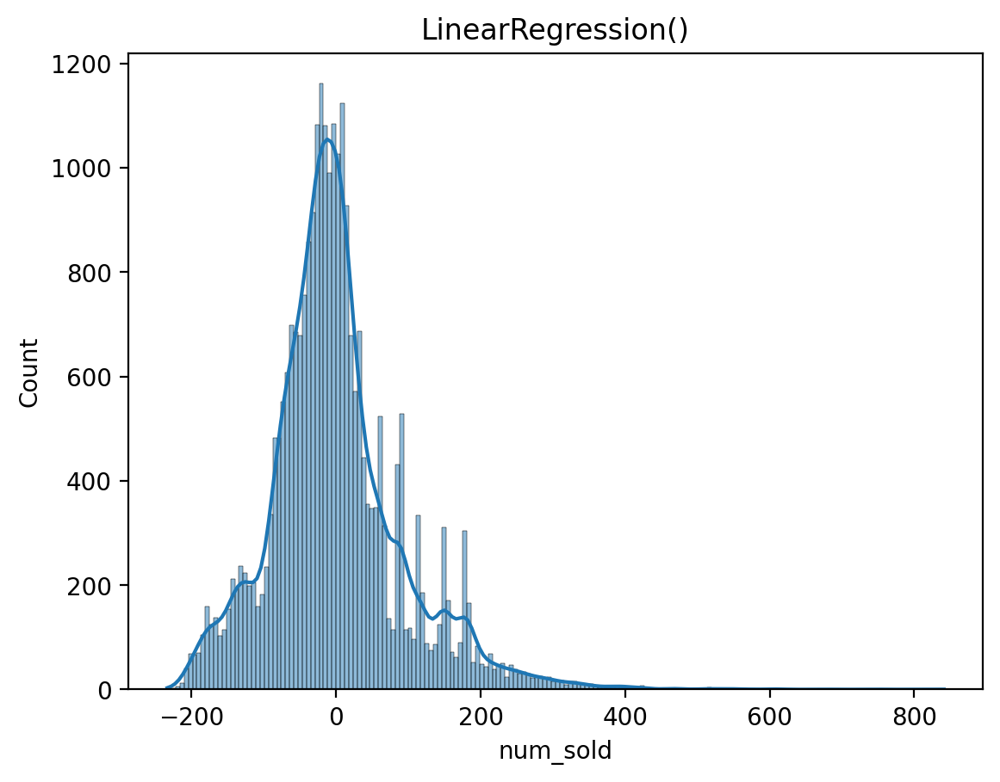

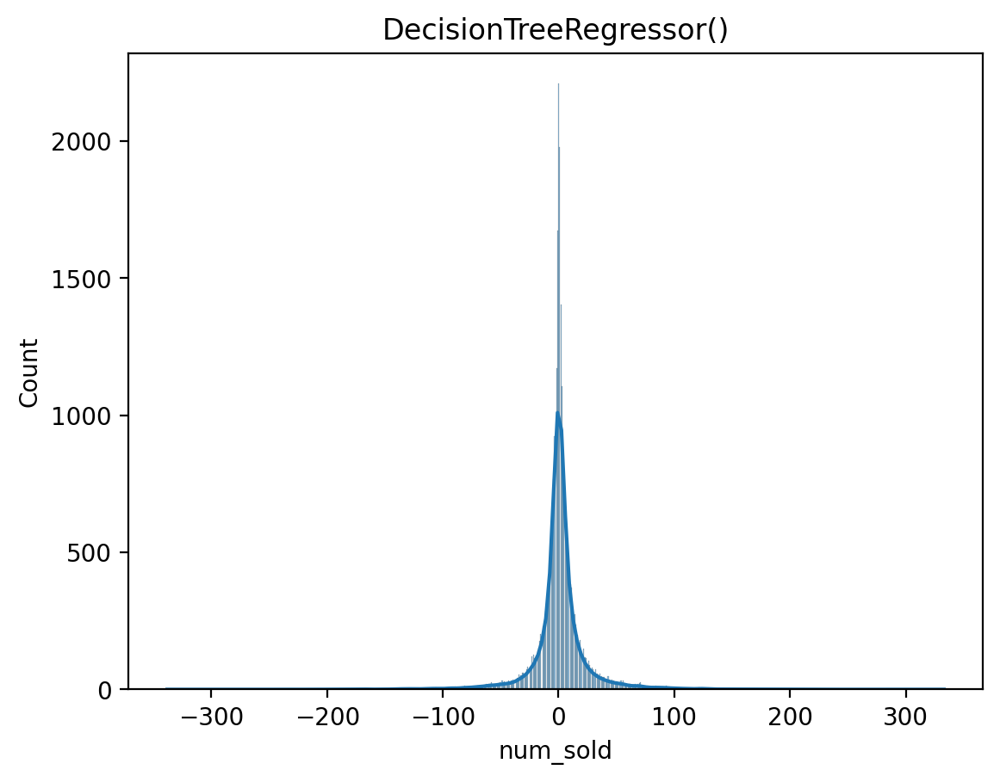

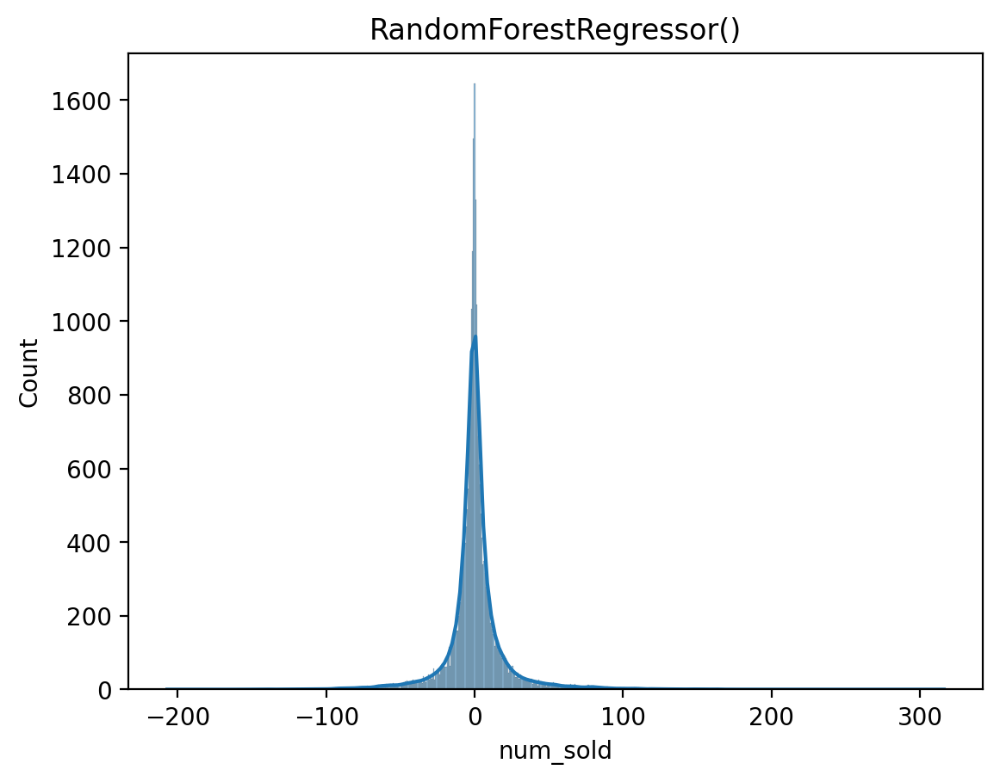

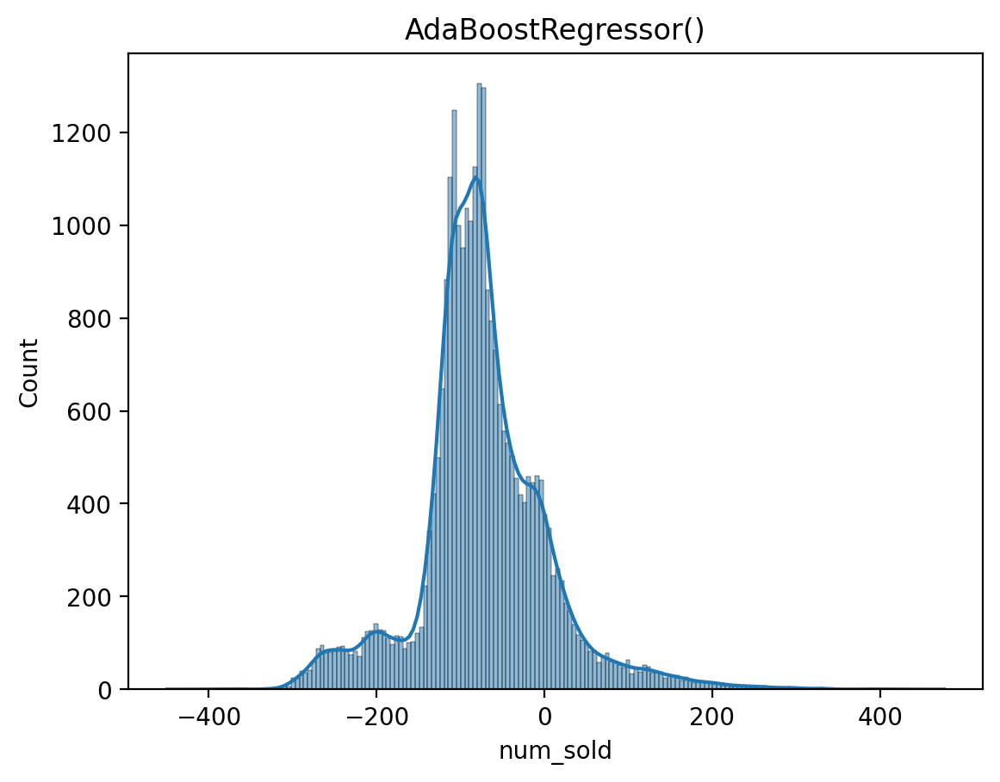

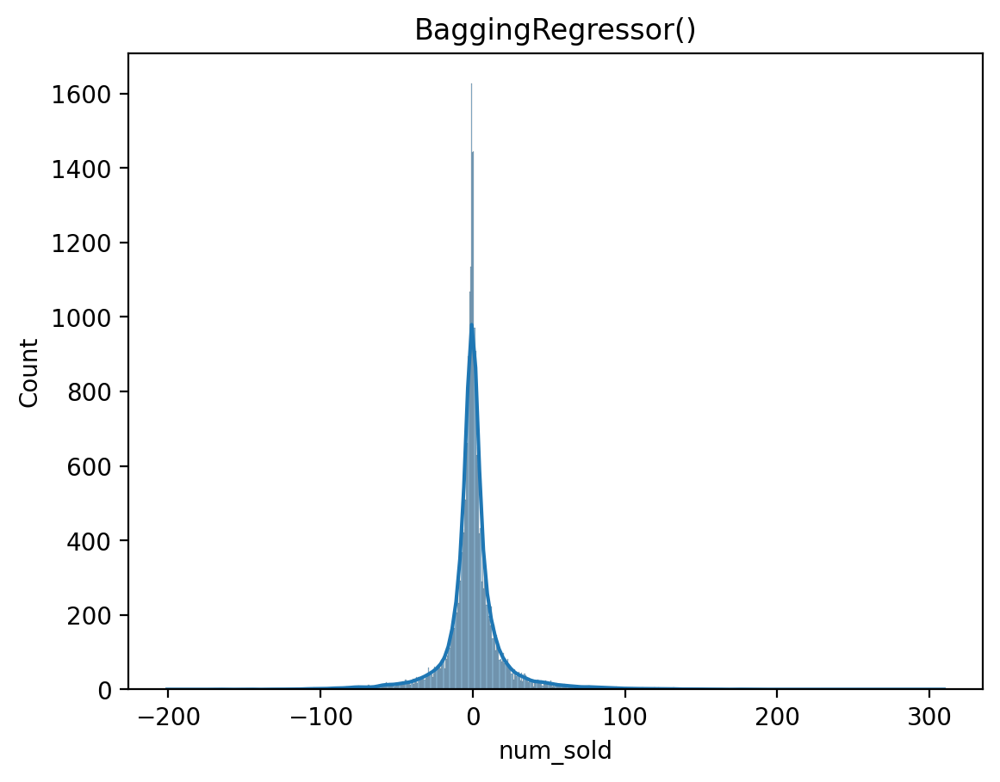

In [61]:
lr_norm = LinearRegression()
tree_norm = DecisionTreeRegressor()
rf_norm = RandomForestRegressor()
ab_norm = AdaBoostRegressor()
br_norm = BaggingRegressor()
for i in [lr_norm, tree_norm, rf_norm, ab_norm, br_norm]:
    helper(i)

In [62]:
y_test_pred = rf_norm.predict(df_test_encoded.drop(['date'],axis=1))
y_test_pred

array([ 37.08,  36.19,   4.9 , ..., 113.84, 627.37, 541.47])

In [63]:
submission = pd.DataFrame(
    {
        'id': df_test['id'],
        'num_sold': y_test_pred
    }
)
submission

,id,num_sold
0,136950,37.08
1,136951,36.19
2,136952,4.90
3,136953,36.78
4,136954,27.49
...,...,...
27370,164320,716.13
27371,164321,729.40
27372,164322,113.84
27373,164323,627.37


In [64]:
submission.to_csv('submission_random_forest_norm_without_scaling.csv', index=None)

RandomForestRegressor(max_features='sqrt', n_estimators=500)

<Figure size 640x480 with 0 Axes>

<Axes: xlabel='num_sold', ylabel='Count'>

score(X_test, y_test)  0.9870677979504863


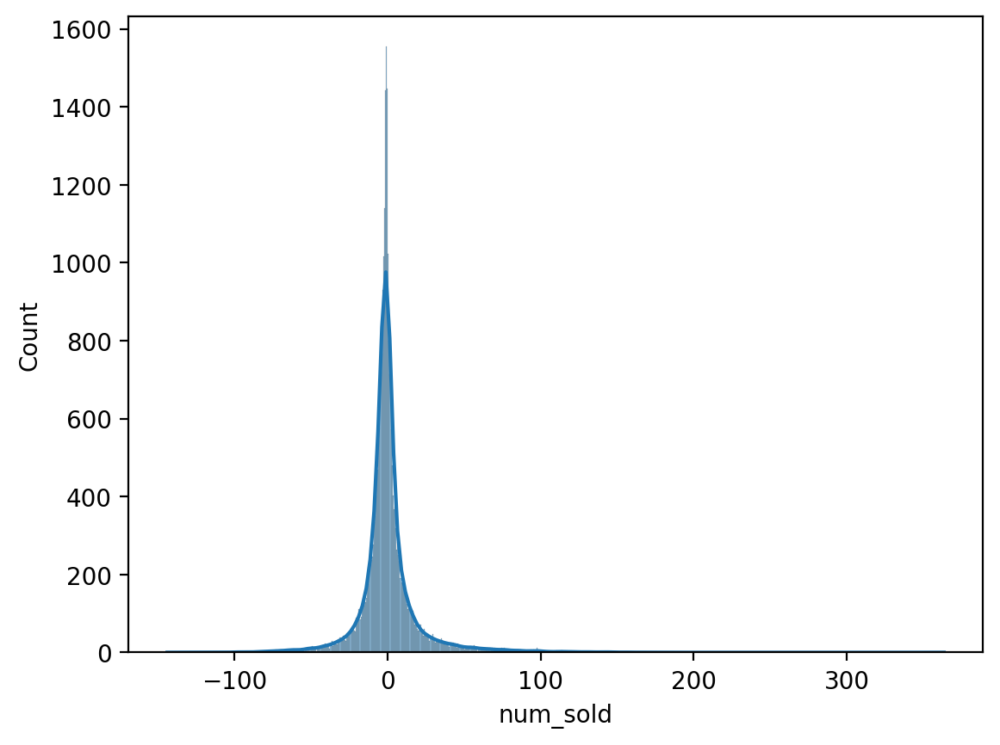

In [65]:
rf_best_params = RandomForestRegressor( max_features='sqrt',n_estimators=500)
rf_best_params.fit(X_train, y_train)
y_pred = rf_best_params.predict(X_test)
plt.figure()
sns.histplot(y_test - y_pred, kde=True)
print("score(X_test, y_test) ", rf_best_params.score(X_test, y_test))

In [66]:
# rf_best_params

pd.DataFrame(
    {
        'id': df_test['id'],
        'num_sold': rf_best_params.predict(df_test_encoded.drop(['date'],axis=1))
    }
).to_csv('submission_rf_best_params_without_scaling.csv', index=None)

### Removing outliers

In [67]:
from matplotlib.cbook import boxplot_stats
boxplot_stats(df_train_encoded['num_sold'])

[{'mean': 165.5226359985396,
  'iqr': 138.0,
  'cilo': 97.41453933659902,
  'cihi': 98.58546066340098,
  'whishi': 391,
  'whislo': 2,
  'fliers': array([1041, 1101, 1062, ...,  752,  641,  539]),
  'q1': 46.0,
  'med': 98.0,
  'q3': 184.0}]

- We see whisker high as 391 and in the below plot, there are many points after that.

/tmp/ipykernel_33/3263624907.py:9: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



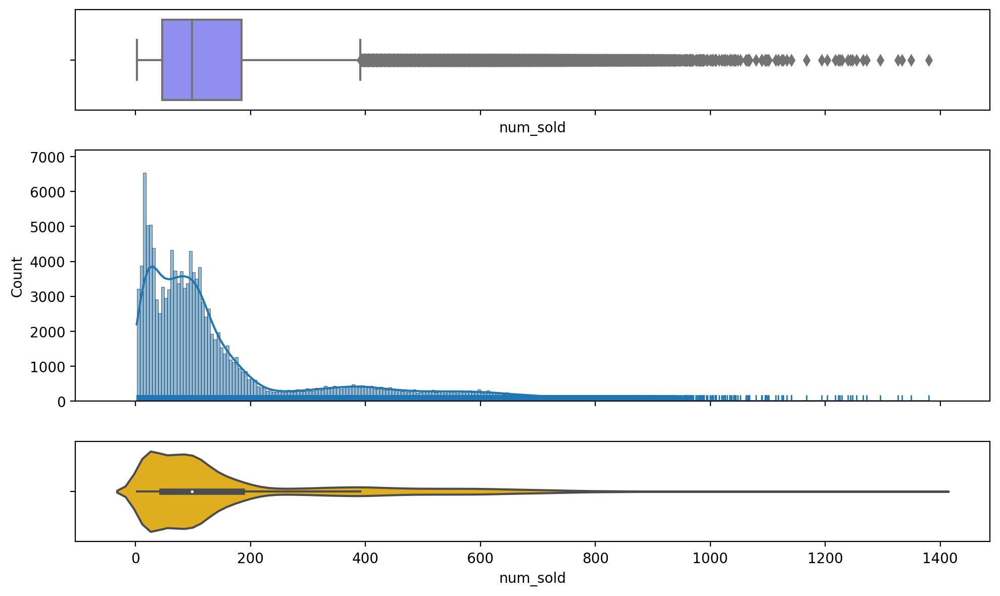

In [68]:
plot_hist_box_violin(df_train_encoded, 'num_sold')

In [69]:
# Removing the values after 400

df_train_encoded[df_train_encoded['num_sold'] >= 391]

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
25,2017-01-01,1041,1,1,2017,52,1,0,0,0,0,0,0,0,0,0
26,2017-01-01,1101,1,1,2017,52,1,0,0,0,0,0,1,0,0,0
28,2017-01-01,1062,1,1,2017,52,1,0,0,0,0,0,0,0,1,0
29,2017-01-01,866,1,1,2017,52,1,0,0,0,0,0,0,0,0,1
40,2017-01-01,501,1,1,2017,52,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136934,2021-12-31,526,31,12,2021,52,0,0,1,0,0,0,0,0,0,1
136945,2021-12-31,700,31,12,2021,52,0,0,0,1,0,0,0,0,0,0
136946,2021-12-31,752,31,12,2021,52,0,0,0,1,0,0,1,0,0,0
136948,2021-12-31,641,31,12,2021,52,0,0,0,1,0,0,0,0,1,0


In [70]:
df_train_encoded.shape

df_train_encoded[df_train_encoded['num_sold'] >= 391].shape

print("Removing the outliers that is",round((df_train_encoded[df_train_encoded['num_sold'] > 391].shape[0] / df_train_encoded.shape[0]),4)*100, "% of the dataset.")

(136950, 16)

(18979, 16)

Removing the outliers that is 13.81 % of the dataset.


In [71]:
df_train_encoded_outliers_removed = df_train_encoded[df_train_encoded['num_sold'] < 391]
df_train_encoded_outliers_removed

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136941,2021-12-31,192,31,12,2021,52,0,0,0,1,0,1,1,0,0,0
136942,2021-12-31,29,31,12,2021,52,0,0,0,1,0,1,0,1,0,0
136943,2021-12-31,175,31,12,2021,52,0,0,0,1,0,1,0,0,1,0
136944,2021-12-31,139,31,12,2021,52,0,0,0,1,0,1,0,0,0,1


/tmp/ipykernel_33/3263624907.py:9: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



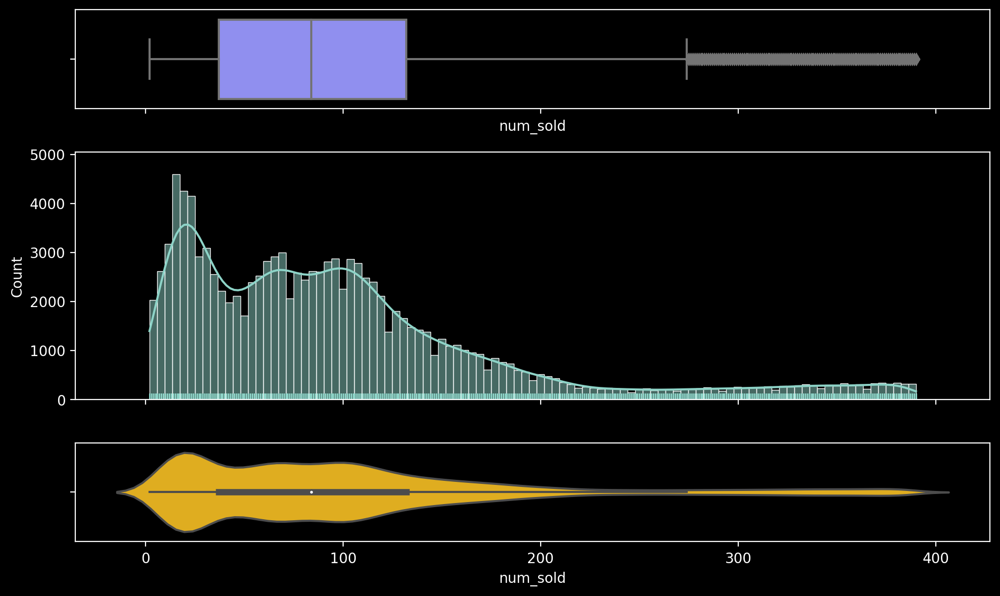

In [72]:
plot_hist_box_violin(df_train_encoded_outliers_removed, 'num_sold')

In [73]:
boxplot_stats(df_train_encoded_outliers_removed['num_sold'])

[{'mean': 101.70895389544889,
  'iqr': 95.0,
  'cilo': 83.56575419936999,
  'cihi': 84.43424580063001,
  'whishi': 274,
  'whislo': 2,
  'fliers': array([340, 371, 364, ..., 383, 360, 315]),
  'q1': 37.0,
  'med': 84.0,
  'q3': 132.0}]

In [74]:
# After 274, we see many points. Let's remove them
df_train_encoded_outliers_removed[df_train_encoded_outliers_removed['num_sold'] > 274]

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
10,2017-01-01,340,1,1,2017,52,0,0,0,0,0,0,0,0,0,0
11,2017-01-01,371,1,1,2017,52,0,0,0,0,0,0,1,0,0,0
13,2017-01-01,364,1,1,2017,52,0,0,0,0,0,0,0,0,1,0
14,2017-01-01,285,1,1,2017,52,0,0,0,0,0,0,0,0,0,1
21,2017-01-01,288,1,1,2017,52,1,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136823,2021-12-30,345,30,12,2021,52,1,0,0,0,0,1,0,0,1,0
136824,2021-12-30,290,30,12,2021,52,1,0,0,0,0,1,0,0,0,1
136895,2021-12-31,383,31,12,2021,52,1,0,0,0,0,1,0,0,0,0
136896,2021-12-31,360,31,12,2021,52,1,0,0,0,0,1,1,0,0,0


In [75]:
df_train_encoded_outliers_removed = df_train_encoded_outliers_removed[df_train_encoded_outliers_removed['num_sold'] < 274]
df_train_encoded_outliers_removed

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136941,2021-12-31,192,31,12,2021,52,0,0,0,1,0,1,1,0,0,0
136942,2021-12-31,29,31,12,2021,52,0,0,0,1,0,1,0,1,0,0
136943,2021-12-31,175,31,12,2021,52,0,0,0,1,0,1,0,0,1,0
136944,2021-12-31,139,31,12,2021,52,0,0,0,1,0,1,0,0,0,1


/tmp/ipykernel_33/3263624907.py:9: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



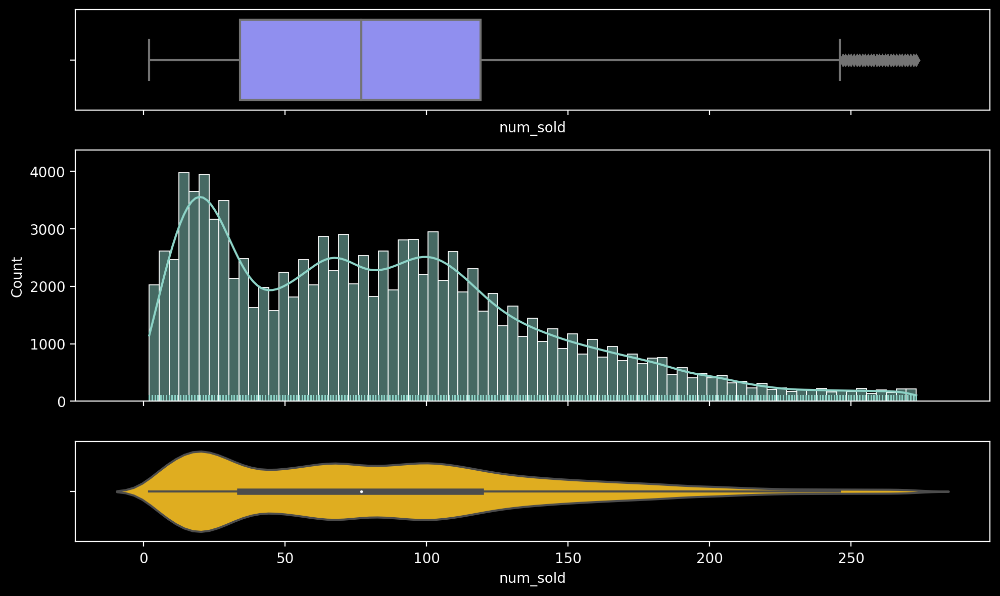

In [76]:
plot_hist_box_violin(df_train_encoded_outliers_removed, 'num_sold')

In [77]:
boxplot_stats(df_train_encoded_outliers_removed['num_sold'])


[{'mean': 84.53639588829255,
  'iqr': 85.0,
  'cilo': 76.5975050236969,
  'cihi': 77.4024949763031,
  'whishi': 246,
  'whislo': 2,
  'fliers': array([268, 249, 270, ..., 252, 252, 260]),
  'q1': 34.0,
  'med': 77.0,
  'q3': 119.0}]

In [78]:
df_train_encoded_outliers_removed = df_train_encoded_outliers_removed[df_train_encoded_outliers_removed['num_sold'] < 246]
df_train_encoded_outliers_removed

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136941,2021-12-31,192,31,12,2021,52,0,0,0,1,0,1,1,0,0,0
136942,2021-12-31,29,31,12,2021,52,0,0,0,1,0,1,0,1,0,0
136943,2021-12-31,175,31,12,2021,52,0,0,0,1,0,1,0,0,1,0
136944,2021-12-31,139,31,12,2021,52,0,0,0,1,0,1,0,0,0,1


/tmp/ipykernel_33/3263624907.py:9: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



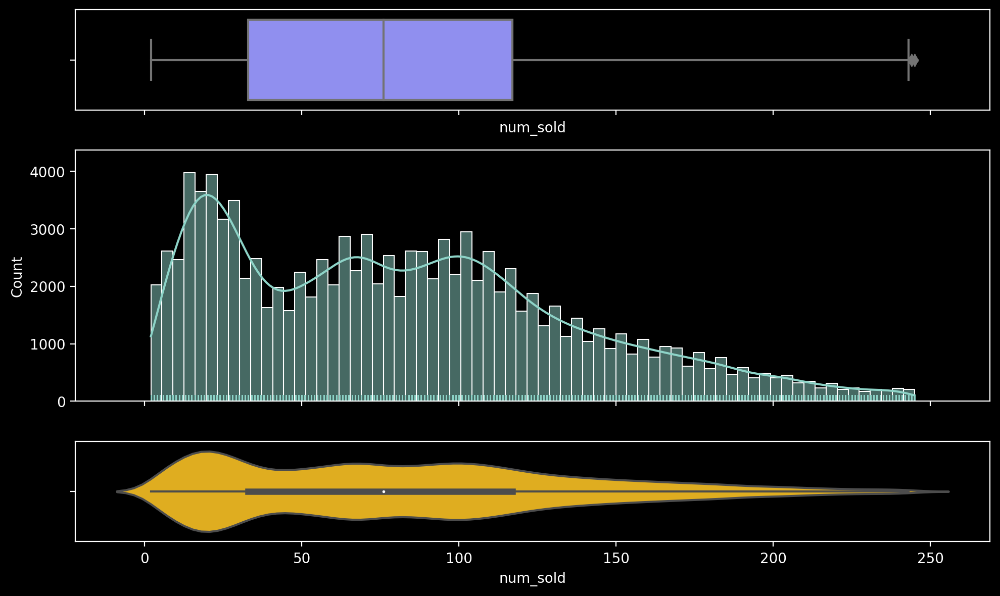

In [79]:
plot_hist_box_violin(df_train_encoded_outliers_removed, 'num_sold')

- #### Now we don't have any outliers

### Re-training the models

In [80]:
X_train, X_test, y_train, y_test = train_test_split(df_train_encoded_outliers_removed.drop(['num_sold','date'],
                                                                  axis=1),
                                                    df_train_encoded_outliers_removed['num_sold'],
                                                    train_size=0.8)
X_train
X_test
y_train
y_test

,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
50144,31,10,2018,44,0,1,0,0,0,0,0,0,0,1
131046,14,10,2021,41,1,0,0,0,0,1,1,0,0,0
92762,21,5,2020,21,0,0,0,1,1,0,0,1,0,0
20746,4,10,2017,40,0,0,1,0,1,0,1,0,0,0
114555,8,3,2021,10,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49352,21,10,2018,42,0,0,0,0,1,0,0,1,0,0
132590,3,11,2021,44,0,0,0,1,0,1,0,0,0,0
56988,30,1,2019,5,0,0,0,1,1,0,0,0,1,0
60522,18,3,2019,12,0,0,0,1,0,0,0,1,0,0


,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
98042,31,7,2020,31,1,0,0,0,1,0,0,1,0,0
5564,16,3,2017,11,0,0,0,0,0,0,0,0,0,1
100660,4,9,2020,36,0,0,0,0,0,0,0,0,0,0
19717,20,9,2017,38,0,0,0,1,0,1,0,1,0,0
33315,21,3,2018,12,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128792,14,9,2021,37,1,0,0,0,1,0,0,1,0,0
130544,7,10,2021,40,0,1,0,0,0,0,0,0,0,1
104196,21,10,2020,43,1,0,0,0,0,1,1,0,0,0
86419,27,2,2020,9,1,0,0,0,1,0,0,0,0,1


50144     205
131046    200
92762      10
20746     102
114555     61
         ... 
49352       6
132590    133
56988      67
60522      68
77745     136
Name: num_sold, Length: 86777, dtype: int64

98042      18
5564      199
100660    137
19717      17
33315     101
         ... 
128792     18
130544    244
104196    167
86419      93
83941     129
Name: num_sold, Length: 21695, dtype: int64

LinearRegression()
score(X_test, y_test)  0.7946324446583408
mean_squared_log_error  0.6945217740649349

DecisionTreeRegressor()
score(X_test, y_test)  0.9648619423828781
mean_squared_log_error  0.08222683828590849

RandomForestRegressor()
score(X_test, y_test)  0.9767803297421387
mean_squared_log_error  0.0694092715820606

AdaBoostRegressor()
score(X_test, y_test)  0.6065435435044426
mean_squared_log_error  1.0611300527666594

BaggingRegressor()
score(X_test, y_test)  0.9750630810977743
mean_squared_log_error  0.07175009836224287



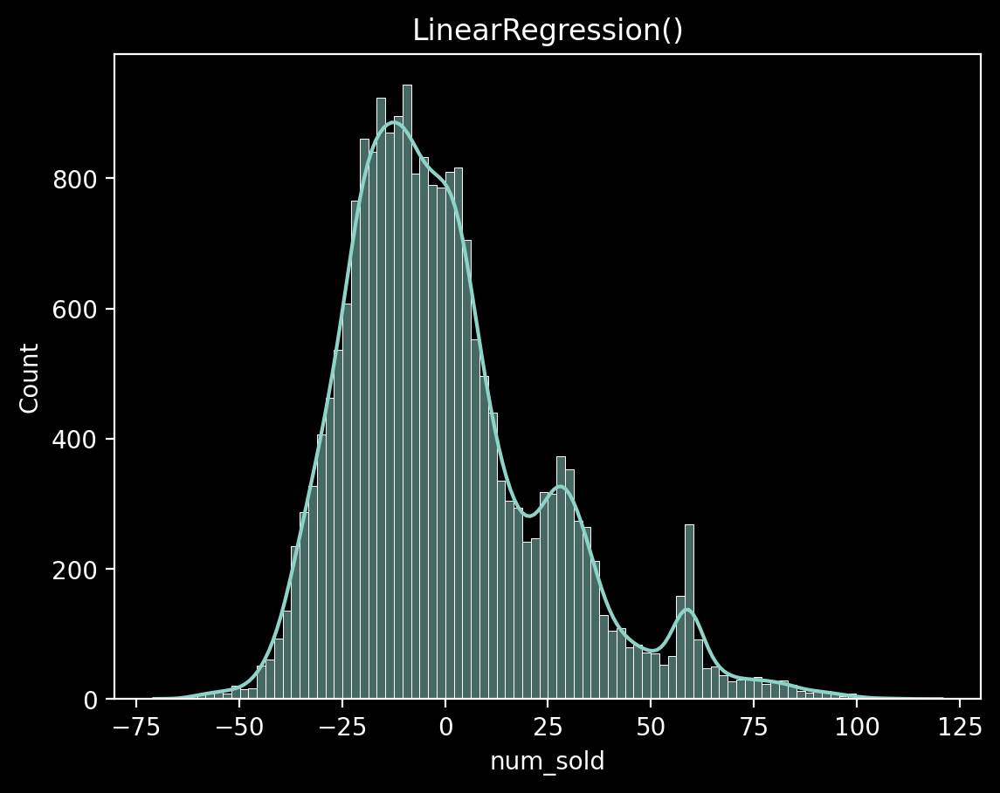

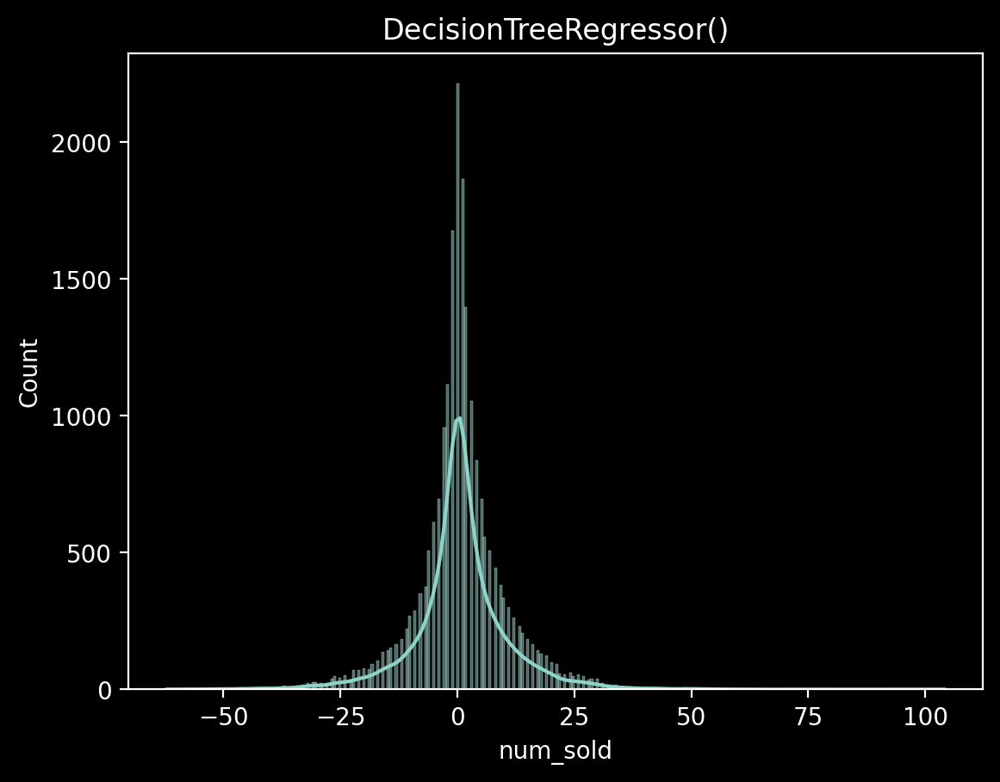

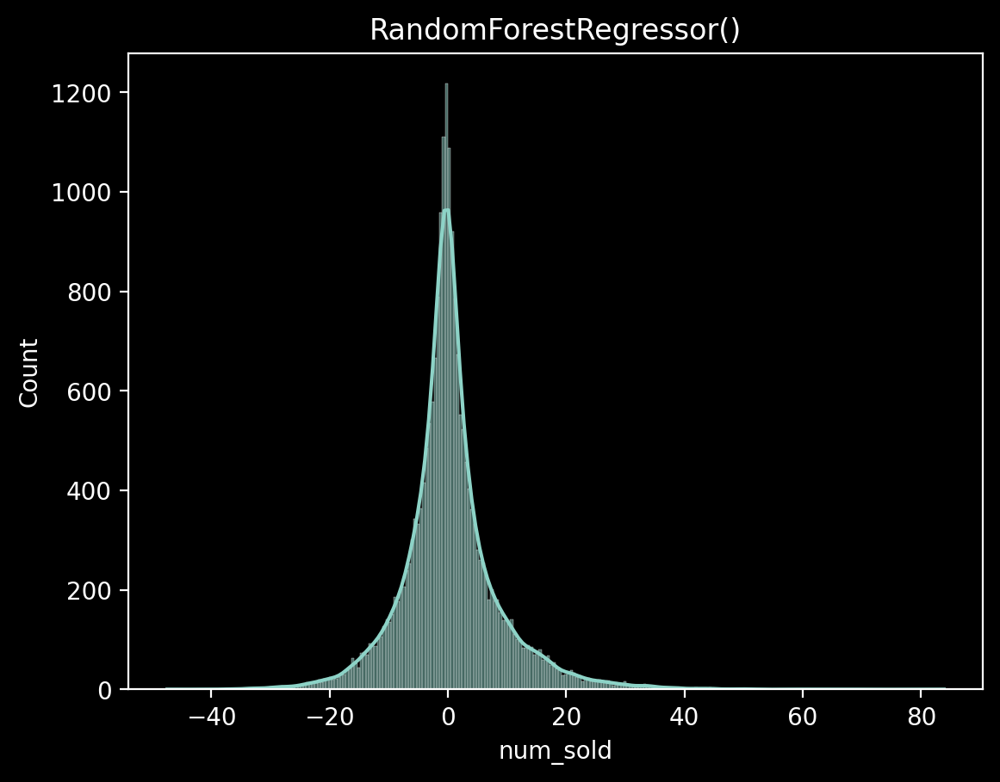

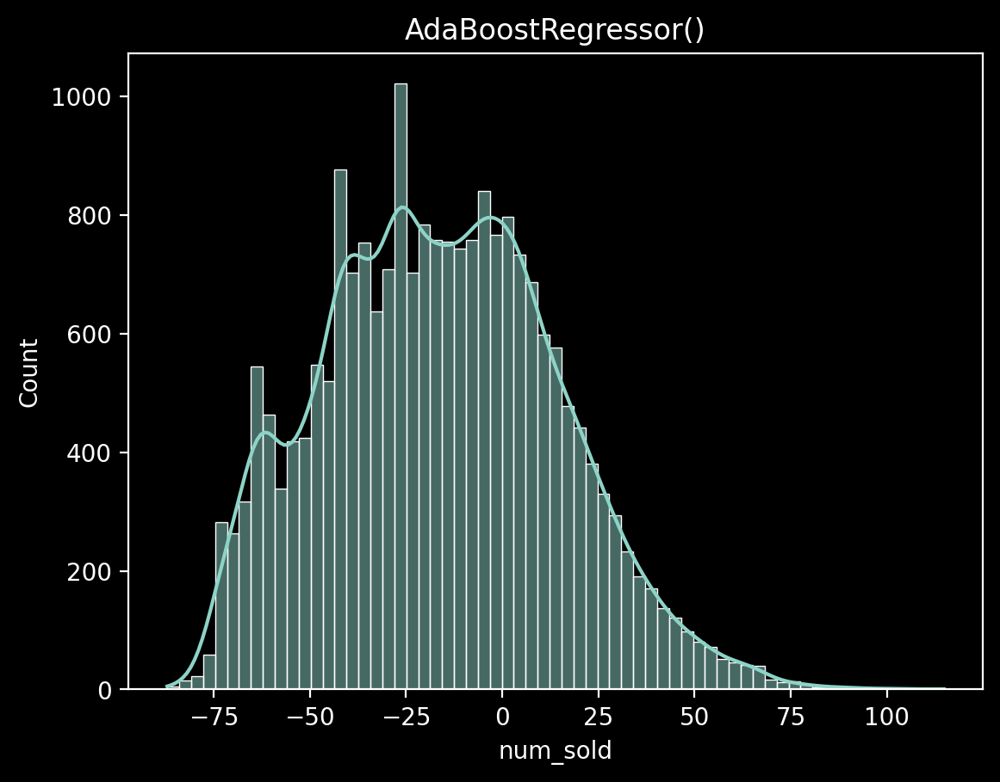

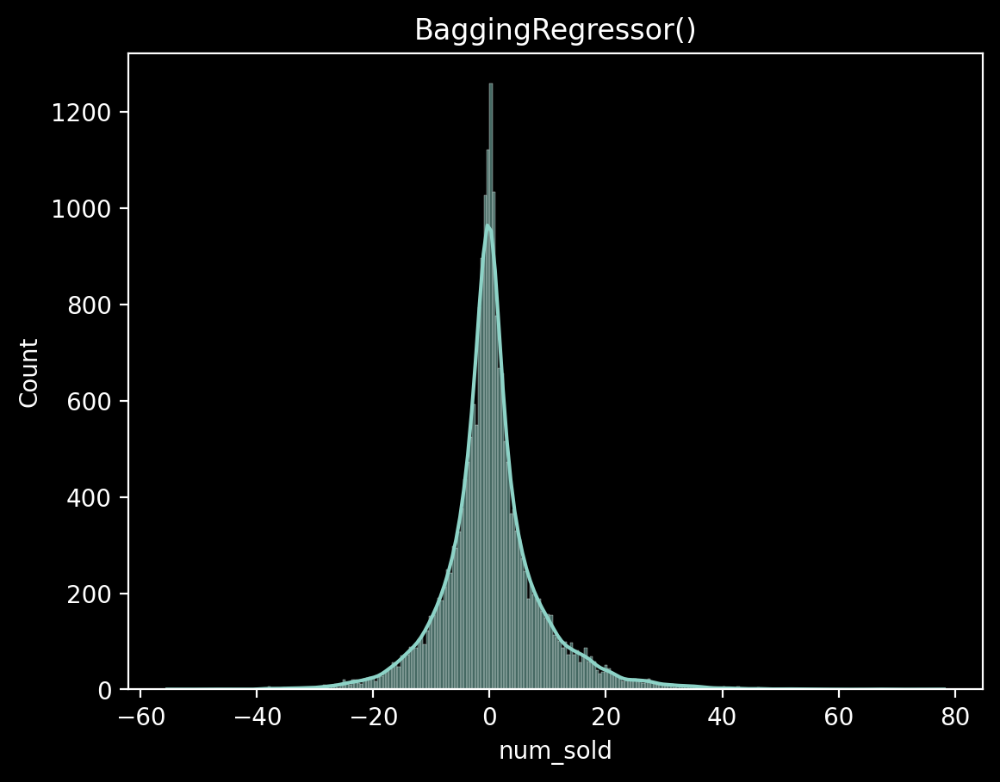

In [81]:
lr_outliers_removed = LinearRegression()
tree_outliers_removed = DecisionTreeRegressor()
rf_outliers_removed = RandomForestRegressor()
ab_outliers_removed = AdaBoostRegressor()
br_outliers_removed = BaggingRegressor()
for i in [lr_outliers_removed, tree_outliers_removed, rf_outliers_removed, ab_outliers_removed, br_outliers_removed]:
    helper(i)

In [82]:
y_test_pred_rf_outliers_removed = rf_outliers_removed.predict(df_test_encoded.drop(['date'],axis=1))
y_test_pred_rf_outliers_removed

array([ 38.16,  36.57,   5.05, ..., 114.78, 239.37, 239.95])

In [83]:
submission_rf_outliers_removed = pd.DataFrame(
    {
        'id': df_test['id'],
        'num_sold': y_test_pred_rf_outliers_removed
    }
)
submission_rf_outliers_removed

,id,num_sold
0,136950,38.16
1,136951,36.57
2,136952,5.05
3,136953,36.26
4,136954,26.67
...,...,...
27370,164320,239.44
27371,164321,239.44
27372,164322,114.78
27373,164323,239.37


In [84]:
submission_rf_outliers_removed.to_csv('submission_rf_outliers_removed_without_scaling.csv', index=None)

In [85]:
plt.figure(figsize=(20,5))
# df_train_normalized_outliers_removed['num_sold'].plot()
# df_train_normalized_outliers_removed.set_index('date')['num_sold'].plot()
px.line(df_train_normalized_outliers_removed.set_index('date'), y='num_sold')

<Figure size 2000x500 with 0 Axes>

NameError: name 'df_train_normalized_outliers_removed' is not defined

<Figure size 2000x500 with 0 Axes>

In [ ]:
df_train_normalized_outliers_removed = df_train_encoded_outliers_removed.copy()
df_train_normalized_outliers_removed

### Lags, ACF & PACF

In [86]:
df_train_encoded

,date,num_sold,Day,Month,Year,Week,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,2017-01-01,63,1,1,2017,52,0,0,0,0,1,0,0,0,0,0
1,2017-01-01,66,1,1,2017,52,0,0,0,0,1,0,1,0,0,0
2,2017-01-01,9,1,1,2017,52,0,0,0,0,1,0,0,1,0,0
3,2017-01-01,59,1,1,2017,52,0,0,0,0,1,0,0,0,1,0
4,2017-01-01,49,1,1,2017,52,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136945,2021-12-31,700,31,12,2021,52,0,0,0,1,0,0,0,0,0,0
136946,2021-12-31,752,31,12,2021,52,0,0,0,1,0,0,1,0,0,0
136947,2021-12-31,111,31,12,2021,52,0,0,0,1,0,0,0,1,0,0
136948,2021-12-31,641,31,12,2021,52,0,0,0,1,0,0,0,0,1,0


<Figure size 2000x800 with 0 Axes>

<Axes: xlabel='date', ylabel='num_sold'>

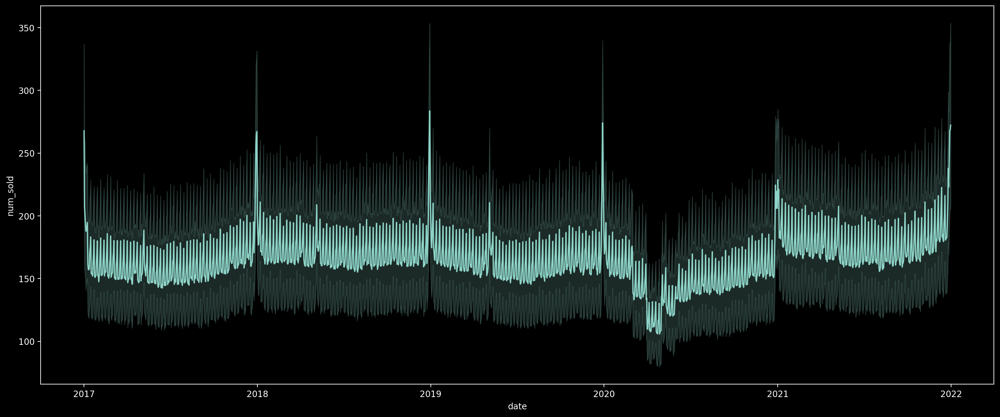

In [89]:
# df_train_encoded
plt.figure(figsize=(20,8))
sns.lineplot(df_train_encoded, x='date',y='num_sold')

In [90]:
from statsmodels.tsa.stattools import acf, pacf

<Figure size 1600x700 with 0 Axes>

Text(0.5, 1.0, 'Autocorrelation Function')

Text(0.5, 0, 'number of lags')

Text(0, 0.5, 'correlation')

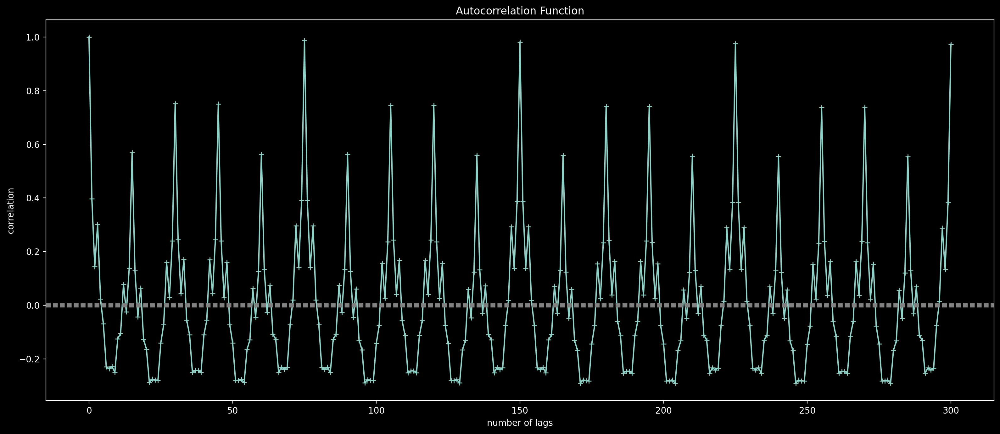

In [93]:
num_sold_acf = acf(df_train_encoded['num_sold'], nlags=300)

#Plot ACF:
plt.figure(figsize=(16, 7))
plt.plot(num_sold_acf,marker='+')
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(df_train_encoded['num_sold'])),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(df_train_encoded['num_sold'])),linestyle='--',color='gray')
plt.title('Autocorrelation Function')
plt.xlabel('number of lags')
plt.ylabel('correlation')
plt.tight_layout()

<Figure size 1600x700 with 0 Axes>

Text(0.5, 1.0, 'Partial Autocorrelation Function')

Text(0.5, 0, 'Number of lags')

Text(0, 0.5, 'correlation')

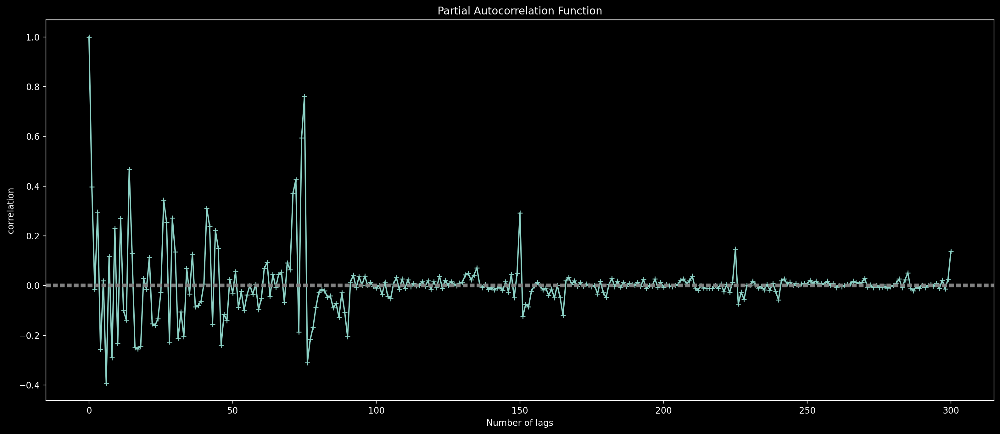

In [95]:
y=df_train_encoded['num_sold']
#calling partial correlation function
lag_pacf = pacf(y, nlags=300, method='ols')
#Plot PACF:
plt.figure(figsize=(16, 7))
plt.plot(lag_pacf,marker='+')
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.xlabel('Number of lag
           s')
plt.ylabel('correlation')
plt.tight_layout()

In [97]:
def plot_acf(y, lags):
    num_sold_acf = acf(y, nlags=lags)
    plt.figure(figsize=(16, 7))
    plt.plot(num_sold_acf,marker='+')
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
    plt.title('Autocorrelation Function')
    plt.xlabel('number of lags')
    plt.ylabel('correlation')
    plt.tight_layout()
                

In [108]:
def plot_pacf(y, lags):
    lag_pacf = pacf(y, nlags=lags, method='ols')
    #Plot PACF:
    plt.figure(figsize=(16, 7))
    plt.plot(lag_pacf,marker='+')
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
    plt.title('Partial Autocorrelation Function')
    plt.xlabel('Number of lags')
    plt.ylabel('correlation')
    plt.tight_layout()

In [100]:
# df_train_encoded['store'].unique()
df_train


,date,country,store,product,num_sold,Day,Month,Year,Week
0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63,1,1,2017,52
1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66,1,1,2017,52
2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9,1,1,2017,52
3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59,1,1,2017,52
4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49,1,1,2017,52
...,...,...,...,...,...,...,...,...,...
136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700,31,12,2021,52
136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752,31,12,2021,52
136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111,31,12,2021,52
136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641,31,12,2021,52


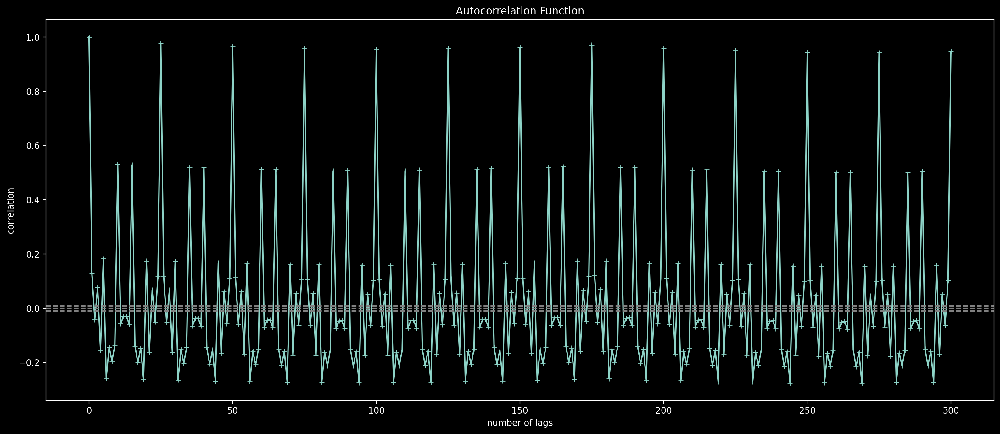

In [106]:

plot_acf(df_train[df_train['store']=='Kagglazon']['num_sold'], lags = 300)

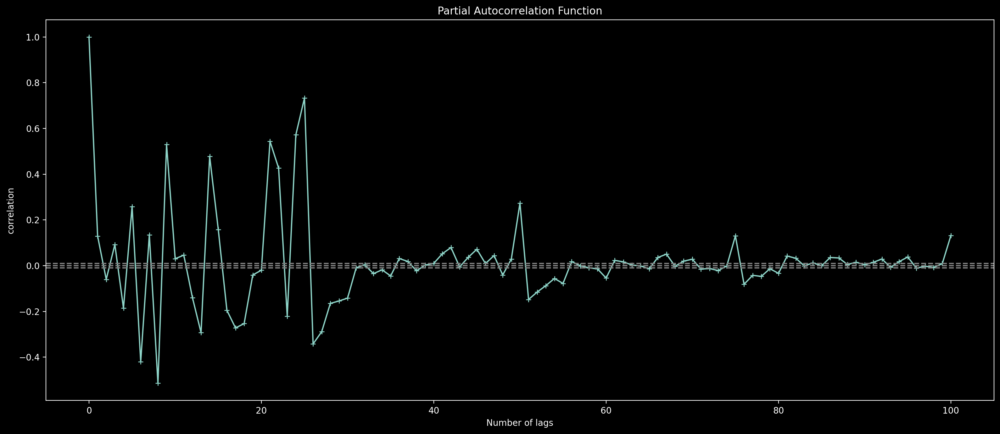

In [109]:
plot_pacf(df_train[df_train['store']=='Kagglazon']['num_sold'], lags = 100)